In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [34]:
import warnings

# Ignore all warnings
warnings.filterwarnings("ignore")

# Reset if needed below
# warnings.filterwarnings("default")

import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd
import matplotlib.ticker as mtick
from sklearn.model_selection import train_test_split
import tensorflow as tf
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
import tensorflow as tf
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, Conv2D, Conv2DTranspose, BatchNormalization, LeakyReLU, Flatten, Reshape, Concatenate, Input, ReLU
import matplotlib.pyplot as plt
import matplotlib.ticker as mtick
from itertools import combinations
from sklearn.metrics import jaccard_score


pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

pd.set_option('display.float_format', '{:.2f}'.format)

from matplotlib.ticker import ScalarFormatter

In [4]:
ppp = pd.read_csv('/content/drive/MyDrive/Datasets/final_blended_ppp_scores.csv')
ppp.head(5)

,LoanNumber,DateApproved,SBAOfficeCode,ProcessingMethod,BorrowerName,BorrowerAddress,BorrowerCity,BorrowerState,BorrowerZip,LoanStatusDate,LoanStatus,Term,SBAGuarantyPercentage,InitialApprovalAmount,CurrentApprovalAmount,UndisbursedAmount,FranchiseName,ServicingLenderLocationID,ServicingLenderName,ServicingLenderAddress,ServicingLenderCity,ServicingLenderState,ServicingLenderZip,RuralUrbanIndicator,HubzoneIndicator,LMIIndicator,BusinessAgeDescription,ProjectCity,ProjectCountyName,ProjectState,ProjectZip,CD,JobsReported,NAICSCode,Race,Ethnicity,UTILITIES_PROCEED,PAYROLL_PROCEED,MORTGAGE_INTEREST_PROCEED,RENT_PROCEED,REFINANCE_EIDL_PROCEED,HEALTH_CARE_PROCEED,DEBT_INTEREST_PROCEED,BusinessType,OriginatingLenderLocationID,OriginatingLender,OriginatingLenderCity,OriginatingLenderState,Gender,Veteran,NonProfit,ForgivenessAmount,ForgivenessDate,UTILITIES_PROCEED_purpose,PAYROLL_PROCEED_purpose,MORTGAGE_INTEREST_PROCEED_purpose,RENT_PROCEED_purpose,REFINANCE_EIDL_PROCEED_purpose,HEALTH_CARE_PROCEED_purpose,DEBT_INTEREST_PROCEED_purpose,NAICS Industry Description,Size standards in number of employees,Forgiven,non_forgiven_loan_portion,ApprovalDifference,ApprovalDifference_per_employee,InitialApprovalAmount_per_employee,CurrentApprovalAmount_per_employee,UTILITIES_PROCEED_per_employee,PAYROLL_PROCEED_per_employee,MORTGAGE_INTEREST_PROCEED_per_employee,RENT_PROCEED_per_employee,REFINANCE_EIDL_PROCEED_per_employee,HEALTH_CARE_PROCEED_per_employee,DEBT_INTEREST_PROCEED_per_employee,ForgivenessAmount_per_employee,Prior PPP count,Prior PPS count,expected_UTILITIES_PROCEED,expected_PAYROLL_PROCEED,expected_MORTGAGE_INTEREST_PROCEED,expected_RENT_PROCEED,expected_REFINANCE_EIDL_PROCEED,expected_HEALTH_CARE_PROCEED,expected_DEBT_INTEREST_PROCEED,expected_ForgivenessAmount,expected_ApprovalDifference,expected_InitialApprovalAmount,expected_CurrentApprovalAmount,deviant_JR,deviant_JR_risk_score,deviant_UTILITIES_PROCEED,deviant_PAYROLL_PROCEED,deviant_MORTGAGE_INTEREST_PROCEED,deviant_RENT_PROCEED,deviant_REFINANCE_EIDL_PROCEED,deviant_HEALTH_CARE_PROCEED,deviant_DEBT_INTEREST_PROCEED,deviant_ForgivenessAmount,deviant_ApprovalDifference,deviant_InitialApprovalAmount,deviant_CurrentApprovalAmount,deviant_UTILITIES_PROCEED_risk_score,deviant_PAYROLL_PROCEED_risk_score,deviant_MORTGAGE_INTEREST_PROCEED_risk_score,deviant_RENT_PROCEED_risk_score,deviant_REFINANCE_EIDL_PROCEED_risk_score,deviant_HEALTH_CARE_PROCEED_risk_score,deviant_DEBT_INTEREST_PROCEED_risk_score,deviant_ForgivenessAmount_risk_score,deviant_ApprovalDifference_risk_score,deviant_InitialApprovalAmount_risk_score,deviant_CurrentApprovalAmount_risk_score,average_risk_score,state_name,scores,sklearn_anomaly_score,sklearn_normalized_scores,sklearn_anomaly,h2o_if_anomaly_score,h2o_if_mean_length,h2o_if_anomaly,average_risk_score_anomaly_indicator,final_anomaly_score,final_blended_anomaly_indicator
0,9547507704,2020-05-01,464,PPP,"SUMTER COATINGS, INC.",2410 HIGHWAY 15 SOUTH,SUMTER,UNKNOWN/NOTSTATED,29150,2020-12-18,PAID IN FULL,24,100,769358.78,769358.78,0.00,UNKNOWN/NOTSTATED,19248,SYNOVUS BANK,1148 BROADWAY,COLUMBUS,GA,31901,U,N,N,EXISTING OR MORE THAN 2 YEARS OLD,SUMTER,SUMTER,SC,29150,SC-05,62.00,325510.00,UNANSWERED,UNKNOWN/NOTSTATED,0.00,769358.78,0.00,0.00,0.00,0.00,0.00,CORPORATION,19248,SYNOVUS BANK,COLUMBUS,GA,UNANSWERED,UNANSWERED,N,773553.37,2020-11-20,0,1,0,0,0,0,0,Paint and Coating Manufacturing,1000.00,1,-4194.59,0.00,0.00,12409.01,12409.01,0.00,12409.01,0.00,0.00,0.00,0.00,0.00,12476.67,0,0,0.00,769.36,0.00,0.00,0.00,0.00,0.00,773.55,0.00,769.36,769.36,0.94,0.83,0.00,999.00,0.00,0.00,0.00,0.00,0.00,999.00,0.00,999.00,999.00,0.00,0.96,0.00,0.00,0.00,0.00,0.00,0.97,0.00,0.96,0.96,0.35,0,0.12,1,0.22,0,0.01,20.89,0,0,0.20,0
1,9777677704,2020-05-01,464,PPP,"PLEASANT PLACES, INC.",7684 SOUTHRAIL ROAD,NORTH CHARLESTON,UNKNOWN/NOTSTATED,29420,2021-09-28,PAID IN FULL,24,100,736927.79,736927.79,0.00,UNKNOWN/NOTSTATED,19248,SYNOVUS BANK,1148 BROADWAY,COLUMBUS,GA,31901,U,Y,Y,EXISTING

In [5]:
# print len of ppp dataset
len(ppp)

965548

In [7]:
# count anomalies identified by blended ML model
len(ppp[ppp['final_blended_anomaly_indicator']==1])

14484

In [9]:
# count anomalies identified by sklearn isolation forest model
len(ppp[ppp['sklearn_anomaly']==1])

9656

In [12]:
# create dataframe of only loans identified as anomalous by sklearn if model
skl_anomalies = ppp[ppp['sklearn_anomaly']==1]
sample_skl_anomalies = skl_anomalies.sample(frac = 0.30, random_state = 42)
sample_skl_anomalies.head()

,LoanNumber,DateApproved,SBAOfficeCode,ProcessingMethod,BorrowerName,BorrowerAddress,BorrowerCity,BorrowerState,BorrowerZip,LoanStatusDate,LoanStatus,Term,SBAGuarantyPercentage,InitialApprovalAmount,CurrentApprovalAmount,UndisbursedAmount,FranchiseName,ServicingLenderLocationID,ServicingLenderName,ServicingLenderAddress,ServicingLenderCity,ServicingLenderState,ServicingLenderZip,RuralUrbanIndicator,HubzoneIndicator,LMIIndicator,BusinessAgeDescription,ProjectCity,ProjectCountyName,ProjectState,ProjectZip,CD,JobsReported,NAICSCode,Race,Ethnicity,UTILITIES_PROCEED,PAYROLL_PROCEED,MORTGAGE_INTEREST_PROCEED,RENT_PROCEED,REFINANCE_EIDL_PROCEED,HEALTH_CARE_PROCEED,DEBT_INTEREST_PROCEED,BusinessType,OriginatingLenderLocationID,OriginatingLender,OriginatingLenderCity,OriginatingLenderState,Gender,Veteran,NonProfit,ForgivenessAmount,ForgivenessDate,UTILITIES_PROCEED_purpose,PAYROLL_PROCEED_purpose,MORTGAGE_INTEREST_PROCEED_purpose,RENT_PROCEED_purpose,REFINANCE_EIDL_PROCEED_purpose,HEALTH_CARE_PROCEED_purpose,DEBT_INTEREST_PROCEED_purpose,NAICS Industry Description,Size standards in number of employees,Forgiven,non_forgiven_loan_portion,ApprovalDifference,ApprovalDifference_per_employee,InitialApprovalAmount_per_employee,CurrentApprovalAmount_per_employee,UTILITIES_PROCEED_per_employee,PAYROLL_PROCEED_per_employee,MORTGAGE_INTEREST_PROCEED_per_employee,RENT_PROCEED_per_employee,REFINANCE_EIDL_PROCEED_per_employee,HEALTH_CARE_PROCEED_per_employee,DEBT_INTEREST_PROCEED_per_employee,ForgivenessAmount_per_employee,Prior PPP count,Prior PPS count,expected_UTILITIES_PROCEED,expected_PAYROLL_PROCEED,expected_MORTGAGE_INTEREST_PROCEED,expected_RENT_PROCEED,expected_REFINANCE_EIDL_PROCEED,expected_HEALTH_CARE_PROCEED,expected_DEBT_INTEREST_PROCEED,expected_ForgivenessAmount,expected_ApprovalDifference,expected_InitialApprovalAmount,expected_CurrentApprovalAmount,deviant_JR,deviant_JR_risk_score,deviant_UTILITIES_PROCEED,deviant_PAYROLL_PROCEED,deviant_MORTGAGE_INTEREST_PROCEED,deviant_RENT_PROCEED,deviant_REFINANCE_EIDL_PROCEED,deviant_HEALTH_CARE_PROCEED,deviant_DEBT_INTEREST_PROCEED,deviant_ForgivenessAmount,deviant_ApprovalDifference,deviant_InitialApprovalAmount,deviant_CurrentApprovalAmount,deviant_UTILITIES_PROCEED_risk_score,deviant_PAYROLL_PROCEED_risk_score,deviant_MORTGAGE_INTEREST_PROCEED_risk_score,deviant_RENT_PROCEED_risk_score,deviant_REFINANCE_EIDL_PROCEED_risk_score,deviant_HEALTH_CARE_PROCEED_risk_score,deviant_DEBT_INTEREST_PROCEED_risk_score,deviant_ForgivenessAmount_risk_score,deviant_ApprovalDifference_risk_score,deviant_InitialApprovalAmount_risk_score,deviant_CurrentApprovalAmount_risk_score,average_risk_score,state_name,scores,sklearn_anomaly_score,sklearn_normalized_scores,sklearn_anomaly,h2o_if_anomaly_score,h2o_if_mean_length,h2o_if_anomaly,average_risk_score_anomaly_indicator,final_anomaly_score,final_blended_anomaly_indicator
839276,2325887705,2020-05-01,671,PPP,"CME PRINTING, INC.",8181 COMMERCE PARK DR STE 708,HOUSTON,TX,77036,2021-07-23,PAID IN FULL,24,100,349567.00,349567.00,0.00,UNKNOWN/NOTSTATED,48270,"JPMORGAN CHASE BANK, NATIONAL ASSOCIATION",1111 POLARIS PKWY,COLUMBUS,OH,43240,U,Y,Y,EXISTING OR MORE THAN 2 YEARS OLD,HOUSTON,HARRIS,TX,77036,TX-09,320.00,323111.00,UNANSWERED,UNKNOWN/NOTSTATED,9000.00,262176.00,0.00,45000.00,0.00,32391.00,1000.00,CORPORATION,48270,"JPMORGAN CHASE BANK, NATIONAL ASSOCIATION",COLUMBUS,OH,FEMALE OWNED,UNANSWERED,N,353544.68,2021-06-24,1,1,0,1,0,1,1,Commercial Printing (except Screen and Books),650.00,1,-3977.68,0.00,0.00,1092.40,1092.40,28.12,819.30,0.00,140.62,0.00,101.22,3.12,1104.83,0,0,13.85,403.35,0.00,69.23,0.00,49.83,1.54,543.91,0.00,537.80,537.80,0.51,0.41,649.00,649.00,0.00,649.00,0.00,649.00,649.00,649.00,0.00,649.00,649.00,0.98,0.93,0.00,0.99,0.00,1.00,1.00,0.94,0.00,0.94,0.94,0.70,Texas,-0.03,-1,0.58,1,0.03,20.61,0,1,0.44,1
956121,2723937103,2020-04-11,563,PPP,US COMPETITION ARMS INC,1925 ROOSVELT AVE,RACINE,WI,53406,2021-03-04,PAID IN FULL,24,100,228100.00,195900.00,

In [13]:
len(sample_skl_anomalies)

2897

In [14]:
sample_skl_anomalies['average_risk_score_anomaly_indicator'].value_counts()

0    1853
1    1044
Name: average_risk_score_anomaly_indicator, dtype: int64

In [15]:
sample_skl_anomalies['h2o_if_anomaly'].value_counts()

1    2203
0     694
Name: h2o_if_anomaly, dtype: int64

In [17]:
sample_skl_anomalies['final_blended_anomaly_indicator'].value_counts()

1    2190
0     707
Name: final_blended_anomaly_indicator, dtype: int64

In [19]:
sample_skl_anomalies_columns = list(sample_skl_anomalies.columns)
print(sample_skl_anomalies)

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [20]:
model_columns = ['SBAOfficeCode', 'ProcessingMethod', 'BorrowerCity', 'BorrowerState', 'LoanStatus', 'Term', 'SBAGuarantyPercentage', 'InitialApprovalAmount', 'CurrentApprovalAmount', 'UndisbursedAmount', 'FranchiseName', 'ServicingLenderLocationID', 'ServicingLenderName', 'ServicingLenderCity', 'ServicingLenderState', 'RuralUrbanIndicator', 'HubzoneIndicator', 'LMIIndicator', 'BusinessAgeDescription', 'ProjectCity', 'ProjectCountyName', 'ProjectState', 'CD', 'JobsReported', 'NAICSCode', 'UTILITIES_PROCEED', 'PAYROLL_PROCEED', 'MORTGAGE_INTEREST_PROCEED', 'RENT_PROCEED', 'REFINANCE_EIDL_PROCEED', 'HEALTH_CARE_PROCEED', 'DEBT_INTEREST_PROCEED', 'BusinessType', 'OriginatingLenderLocationID', 'OriginatingLender', 'OriginatingLenderCity', 'OriginatingLenderState', 'NonProfit', 'ForgivenessAmount']


In [21]:
model_sample_input = sample_skl_anomalies[model_columns]
model_sample_input.head()

,SBAOfficeCode,ProcessingMethod,BorrowerCity,BorrowerState,LoanStatus,Term,SBAGuarantyPercentage,InitialApprovalAmount,CurrentApprovalAmount,UndisbursedAmount,FranchiseName,ServicingLenderLocationID,ServicingLenderName,ServicingLenderCity,ServicingLenderState,RuralUrbanIndicator,HubzoneIndicator,LMIIndicator,BusinessAgeDescription,ProjectCity,ProjectCountyName,ProjectState,CD,JobsReported,NAICSCode,UTILITIES_PROCEED,PAYROLL_PROCEED,MORTGAGE_INTEREST_PROCEED,RENT_PROCEED,REFINANCE_EIDL_PROCEED,HEALTH_CARE_PROCEED,DEBT_INTEREST_PROCEED,BusinessType,OriginatingLenderLocationID,OriginatingLender,OriginatingLenderCity,OriginatingLenderState,NonProfit,ForgivenessAmount
839276,671,PPP,HOUSTON,TX,PAID IN FULL,24,100,349567.00,349567.00,0.00,UNKNOWN/NOTSTATED,48270,"JPMORGAN CHASE BANK, NATIONAL ASSOCIATION",COLUMBUS,OH,U,Y,Y,EXISTING OR MORE THAN 2 YEARS OLD,HOUSTON,HARRIS,TX,TX-09,320.00,323111.00,9000.00,262176.00,0.00,45000.00,0.00,32391.00,1000.00,CORPORATION,48270,"JPMORGAN CHASE BANK, NATIONAL ASSOCIATION",COLUMBUS,OH,N,353544.68
956121,563,PPP,RACINE,WI,PAID IN FULL,24,100,228100.00,195900.00,0.00,UNKNOWN/NOTSTATED,76852,COMMUNITY STATE BANK,UNION GROVE,WI,U,N,Y,EXISTING OR MORE THAN 2 YEARS OLD,RACINE,RACINE,WI,WI-01,21.00,332994.00,0.00,183400.00,0.00,0.00,0.00,12500.00,0.00,CORPORATION,76852,COMMUNITY STATE BANK,UNION GROVE,WI,N,197488.67
85387,920,PPP,RIVERSIDE,CA,PAID IN FULL,24,100,374575.00,374575.00,0.00,UNKNOWN/NOTSTATED,4924,CITY NATIONAL BANK,LOS ANGELES,CA,U,N,N,EXISTING OR MORE THAN 2 YEARS OLD,RIVERSIDE,RIVERSIDE,CA,CA-39,34.00,325620.00,35990.00,284634.00,0.00,38923.00,0.00,15028.00,0.00,SUBCHAPTER S CORPORATION,4924,CITY NATIONAL BANK,LOS ANGELES,CA,N,377725.53
794555,474,PPP,MEMPHIS,TN,PAID IN FULL,24,100,765075.00,765075.00,0.00,UNKNOWN/NOTSTATED,4151,FARMERS BANK AND TRUST COMPANY,BLYTHEVILLE,AR,U,N,N,EXISTING OR MORE THAN 2 YEARS OLD,MEMPHIS,SHELBY,TN,TN-09,41.00,483211.00,0.00,612060.00,0.00,0.00,0.00,0.00,153015.00,LIMITED LIABILITY COMPANY(LLC),4151,FARMERS BANK AND TRUST COMPANY,BLYTHEVILLE,AR,N,769410.43
382941,679,PPP,BATON ROUGE,LA,PAID IN FULL,24,100,7268100.00,5774400.00,0.00,UNKNOWN/NOTSTATED,28002,GULF COAST BANK,ABBEVILLE,LA,U,N,Y,EXISTING OR MORE THAN 2 YEARS OLD,BATON ROUGE,EAST BATON ROUGE,LA,LA-06,351.00,541613.00,0.00,5774400.00,0.00,0.00,0.00,0.00,0.00,EMPLOYEE STOCK OWNERSHIP PLAN(ESOP),28002,GULF COAST BANK,ABBEVILLE,LA,N,5840845.15


In [22]:
# Check for missing values
model_sample_input.isnull().sum()

SBAOfficeCode                  0
ProcessingMethod               0
BorrowerCity                   0
BorrowerState                  0
LoanStatus                     0
Term                           0
SBAGuarantyPercentage          0
InitialApprovalAmount          0
CurrentApprovalAmount          0
UndisbursedAmount              0
FranchiseName                  0
ServicingLenderLocationID      0
ServicingLenderName            0
ServicingLenderCity            0
ServicingLenderState           0
RuralUrbanIndicator            0
HubzoneIndicator               0
LMIIndicator                   0
BusinessAgeDescription         0
ProjectCity                    0
ProjectCountyName              0
ProjectState                   0
CD                             0
JobsReported                   0
NAICSCode                      0
UTILITIES_PROCEED              0
PAYROLL_PROCEED                0
MORTGAGE_INTEREST_PROCEED      0
RENT_PROCEED                   0
REFINANCE_EIDL_PROCEED         0
HEALTH_CAR

In [23]:
# Columns from the data dictionary
numerical_cols = ['Term', 'InitialApprovalAmount',
                  'CurrentApprovalAmount', 'UndisbursedAmount', 'JobsReported', 'ForgivenessAmount']

categorical_cols = ['SBAOfficeCode', 'ProcessingMethod', 'BorrowerCity', 'BorrowerState', 'LoanStatus',
                    'ServicingLenderCity', 'ServicingLenderState',
                    'RuralUrbanIndicator', 'HubzoneIndicator', 'LMIIndicator', 'BusinessAgeDescription',
                    'ProjectCity', 'ProjectState', 'CD', 'NAICSCode', 'BusinessType',
                    'OriginatingLender', 'OriginatingLenderCity',
                    'OriginatingLenderState', 'NonProfit']

In [24]:
# Selecting numerical and categorical columns
numerical_data = model_sample_input[numerical_cols]
categorical_data = model_sample_input[categorical_cols]

# Scaling numerical data
scaler = StandardScaler()
scaled_numerical_data = pd.DataFrame(scaler.fit_transform(numerical_data), columns=numerical_cols)

# One-hot encoding categorical data
encoder = OneHotEncoder(handle_unknown='ignore', sparse=False)
encoded_categorical_data = encoder.fit_transform(categorical_data)
encoded_categorical_cols = encoder.get_feature_names_out(input_features=categorical_cols)
encoded_categorical_df = pd.DataFrame(encoded_categorical_data, columns=encoded_categorical_cols)

# Combine scaled numerical and encoded categorical data
processed_data = pd.concat([scaled_numerical_data, encoded_categorical_df], axis=1)


In [26]:
scaled_numerical_data.head()

,Term,InitialApprovalAmount,CurrentApprovalAmount,UndisbursedAmount,JobsReported,ForgivenessAmount
0,-0.30,-1.09,-1.09,0.00,0.42,-1.00
1,-0.30,-1.13,-1.14,0.00,-1.22,-1.06
2,-0.30,-1.08,-1.08,0.00,-1.15,-0.99
3,-0.30,-0.95,-0.94,0.00,-1.11,-0.86
4,-0.30,1.32,0.82,0.00,0.59,0.92


In [25]:
encoded_categorical_df.head()

,SBAOfficeCode_101,SBAOfficeCode_130,SBAOfficeCode_150,SBAOfficeCode_156,SBAOfficeCode_165,SBAOfficeCode_172,SBAOfficeCode_189,SBAOfficeCode_202,SBAOfficeCode_219,SBAOfficeCode_235,SBAOfficeCode_248,SBAOfficeCode_252,SBAOfficeCode_296,SBAOfficeCode_299,SBAOfficeCode_303,SBAOfficeCode_304,SBAOfficeCode_341,SBAOfficeCode_353,SBAOfficeCode_358,SBAOfficeCode_373,SBAOfficeCode_390,SBAOfficeCode_405,SBAOfficeCode_455,SBAOfficeCode_457,SBAOfficeCode_459,SBAOfficeCode_460,SBAOfficeCode_464,SBAOfficeCode_470,SBAOfficeCode_474,SBAOfficeCode_491,SBAOfficeCode_507,SBAOfficeCode_508,SBAOfficeCode_515,SBAOfficeCode_549,SBAOfficeCode_562,SBAOfficeCode_563,SBAOfficeCode_593,SBAOfficeCode_610,SBAOfficeCode_639,SBAOfficeCode_669,SBAOfficeCode_671,SBAOfficeCode_677,SBAOfficeCode_678,SBAOfficeCode_679,SBAOfficeCode_680,SBAOfficeCode_681,SBAOfficeCode_682,SBAOfficeCode_709,SBAOfficeCode_721,SBAOfficeCode_736,SBAOfficeCode_761,SBAOfficeCode_766,SBAOfficeCode_767,SBAOfficeCode_768,SBAOfficeCode_811,SBAOfficeCode_875,SBAOfficeCode_876,SBAOfficeCode_883,SBAOfficeCode_885,SBAOfficeCode_897,SBAOfficeCode_912,SBAOfficeCode_914,SBAOfficeCode_920,SBAOfficeCode_931,SBAOfficeCode_942,SBAOfficeCode_944,SBAOfficeCode_951,SBAOfficeCode_954,SBAOfficeCode_988,SBAOfficeCode_1013,SBAOfficeCode_1084,SBAOfficeCode_1086,SBAOfficeCode_1087,SBAOfficeCode_1094,ProcessingMethod_PPP,ProcessingMethod_PPS,BorrowerCity_ABBEVILLE,BorrowerCity_ABBOTT,BorrowerCity_ABERDEEN,BorrowerCity_ABILENE,BorrowerCity_ACWORTH,BorrowerCity_ADAMS,BorrowerCity_ADAMSVILLE,BorrowerCity_ADDISON,BorrowerCity_ADELANTO,BorrowerCity_AKRON,BorrowerCity_ALBANY,BorrowerCity_ALBERTVILLE,BorrowerCity_ALBUQUERQUE,BorrowerCity_ALDEN,BorrowerCity_ALEXANDRIA,BorrowerCity_ALICE,BorrowerCity_ALISO VIEJO,BorrowerCity_ALLEN,BorrowerCity_ALLEN PARK,BorrowerCity_ALMA,BorrowerCity_ALPENA,BorrowerCity_ALTADENA,BorrowerCity_ALTAMONT,BorrowerCity_ALTOONA,BorrowerCity_ALVIN,BorrowerCity_AMARILLO,BorrowerCity_AMHERST,BorrowerCity_AMORY,BorrowerCity_AMSTERDAM,BorrowerCity_ANAHEIM,BorrowerCity_ANCHORAGE,BorrowerCity_ANDALUSIA,BorrowerCity_ANDERSON,BorrowerCity_ANDOVER,BorrowerCity_ANGOLA,BorrowerCity_ANNAPOLIS,BorrowerCity_ANNISTON,BorrowerCity_ANTIOCH,BorrowerCity_APPLETON,BorrowerCity_ARCADIA,BorrowerCity_ARCHBOLD,BorrowerCity_ARDEN,BorrowerCity_ARDMORE,BorrowerCity_ARKADELPHIA,BorrowerCity_ARLINGTON,BorrowerCity_ARLINGTON HEIGHTS,BorrowerCity_ARNOLD,BorrowerCity_ARTESIA,BorrowerCity_ASHEBORO,BorrowerCity_ASHLAND,BorrowerCity_ASHLAND CITY,BorrowerCity_ASPEN,BorrowerCity_ASTON,BorrowerCity_ASTORIA,BorrowerCity_ATHENS,BorrowerCity_ATKINSON,BorrowerCity_ATLANTA,BorrowerCity_ATLANTIC BEACH,BorrowerCity_ATMORE,BorrowerCity_ATTLEBORO,BorrowerCity_ATTLEBORO FALLS,BorrowerCity_ATWATER,BorrowerCity_AUBURN,BorrowerCity_AUBURN HILLS,BorrowerCity_AUGUSTA,BorrowerCity_AURORA,BorrowerCity_AUSTIN,BorrowerCity_AVON,BorrowerCity_AVONDALE,BorrowerCity_AYER,BorrowerCity_AZLE,BorrowerCity_AZUSA,BorrowerCity_BAINBRIDGE,BorrowerCity_BAKERSFIELD,BorrowerCity_BALDWIN,BorrowerCity_BALL,BorrowerCity_BALTIMORE,BorrowerCity_BANGOR,BorrowerCity_BAR HARBOR,BorrowerCity_BARABOO,BorrowerCity_BARRINGTON,BorrowerCity_BATAVIA,BorrowerCity_BATESVILLE,BorrowerCity_BATON ROUGE,BorrowerCity_BATTLE GROUND,BorrowerCity_BATTLEFIELD,BorrowerCity_BAY SPRINGS,BorrowerCity_BAYAMON,BorrowerCity_BAYTOWN,BorrowerCity_BEAUMONT,BorrowerCity_BEAVER DAM,BorrowerCity_BEAVERCREEK,BorrowerCity_BEAVERTON,BorrowerCity_BEDFORD,BorrowerCity_BEDFORD HEIGTHS,BorrowerCity_BELGIUM,BorrowerCity_BELLEVILLE,BorrowerCity_BELLEVUE,BorrowerCity_BELLINGHAM,BorrowerCity_BELLMAWR,BorrowerCity_BELMONT,BorrowerCity_BENBROOK,BorrowerCity_BEND,BorrowerCity_BENSALEM,BorrowerCity_BENSENVILLE,BorrowerCity_BENTONVILLE,BorrowerCity_BERKELEY,BorrowerCity_BERLIN,BorrowerCity_BERNE,BorrowerCity_BERTHOUD,BorrowerCity_BESSEMER,BorrowerCity_BETHLEHEM,BorrowerCity_BILLINGS,BorrowerCity_BINGHAMTON,BorrowerCity_BIRMINGHAM,BorrowerCity_BISBEE,BorrowerCity_BISHOP,BorrowerCity_BLACK RIVER FALLS,BorrowerCity_BLAIN

In [29]:
processed_data.head()

,Term,InitialApprovalAmount,CurrentApprovalAmount,UndisbursedAmount,JobsReported,ForgivenessAmount,SBAOfficeCode_101,SBAOfficeCode_130,SBAOfficeCode_150,SBAOfficeCode_156,SBAOfficeCode_165,SBAOfficeCode_172,SBAOfficeCode_189,SBAOfficeCode_202,SBAOfficeCode_219,SBAOfficeCode_235,SBAOfficeCode_248,SBAOfficeCode_252,SBAOfficeCode_296,SBAOfficeCode_299,SBAOfficeCode_303,SBAOfficeCode_304,SBAOfficeCode_341,SBAOfficeCode_353,SBAOfficeCode_358,SBAOfficeCode_373,SBAOfficeCode_390,SBAOfficeCode_405,SBAOfficeCode_455,SBAOfficeCode_457,SBAOfficeCode_459,SBAOfficeCode_460,SBAOfficeCode_464,SBAOfficeCode_470,SBAOfficeCode_474,SBAOfficeCode_491,SBAOfficeCode_507,SBAOfficeCode_508,SBAOfficeCode_515,SBAOfficeCode_549,SBAOfficeCode_562,SBAOfficeCode_563,SBAOfficeCode_593,SBAOfficeCode_610,SBAOfficeCode_639,SBAOfficeCode_669,SBAOfficeCode_671,SBAOfficeCode_677,SBAOfficeCode_678,SBAOfficeCode_679,SBAOfficeCode_680,SBAOfficeCode_681,SBAOfficeCode_682,SBAOfficeCode_709,SBAOfficeCode_721,SBAOfficeCode_736,SBAOfficeCode_761,SBAOfficeCode_766,SBAOfficeCode_767,SBAOfficeCode_768,SBAOfficeCode_811,SBAOfficeCode_875,SBAOfficeCode_876,SBAOfficeCode_883,SBAOfficeCode_885,SBAOfficeCode_897,SBAOfficeCode_912,SBAOfficeCode_914,SBAOfficeCode_920,SBAOfficeCode_931,SBAOfficeCode_942,SBAOfficeCode_944,SBAOfficeCode_951,SBAOfficeCode_954,SBAOfficeCode_988,SBAOfficeCode_1013,SBAOfficeCode_1084,SBAOfficeCode_1086,SBAOfficeCode_1087,SBAOfficeCode_1094,ProcessingMethod_PPP,ProcessingMethod_PPS,BorrowerCity_ABBEVILLE,BorrowerCity_ABBOTT,BorrowerCity_ABERDEEN,BorrowerCity_ABILENE,BorrowerCity_ACWORTH,BorrowerCity_ADAMS,BorrowerCity_ADAMSVILLE,BorrowerCity_ADDISON,BorrowerCity_ADELANTO,BorrowerCity_AKRON,BorrowerCity_ALBANY,BorrowerCity_ALBERTVILLE,BorrowerCity_ALBUQUERQUE,BorrowerCity_ALDEN,BorrowerCity_ALEXANDRIA,BorrowerCity_ALICE,BorrowerCity_ALISO VIEJO,BorrowerCity_ALLEN,BorrowerCity_ALLEN PARK,BorrowerCity_ALMA,BorrowerCity_ALPENA,BorrowerCity_ALTADENA,BorrowerCity_ALTAMONT,BorrowerCity_ALTOONA,BorrowerCity_ALVIN,BorrowerCity_AMARILLO,BorrowerCity_AMHERST,BorrowerCity_AMORY,BorrowerCity_AMSTERDAM,BorrowerCity_ANAHEIM,BorrowerCity_ANCHORAGE,BorrowerCity_ANDALUSIA,BorrowerCity_ANDERSON,BorrowerCity_ANDOVER,BorrowerCity_ANGOLA,BorrowerCity_ANNAPOLIS,BorrowerCity_ANNISTON,BorrowerCity_ANTIOCH,BorrowerCity_APPLETON,BorrowerCity_ARCADIA,BorrowerCity_ARCHBOLD,BorrowerCity_ARDEN,BorrowerCity_ARDMORE,BorrowerCity_ARKADELPHIA,BorrowerCity_ARLINGTON,BorrowerCity_ARLINGTON HEIGHTS,BorrowerCity_ARNOLD,BorrowerCity_ARTESIA,BorrowerCity_ASHEBORO,BorrowerCity_ASHLAND,BorrowerCity_ASHLAND CITY,BorrowerCity_ASPEN,BorrowerCity_ASTON,BorrowerCity_ASTORIA,BorrowerCity_ATHENS,BorrowerCity_ATKINSON,BorrowerCity_ATLANTA,BorrowerCity_ATLANTIC BEACH,BorrowerCity_ATMORE,BorrowerCity_ATTLEBORO,BorrowerCity_ATTLEBORO FALLS,BorrowerCity_ATWATER,BorrowerCity_AUBURN,BorrowerCity_AUBURN HILLS,BorrowerCity_AUGUSTA,BorrowerCity_AURORA,BorrowerCity_AUSTIN,BorrowerCity_AVON,BorrowerCity_AVONDALE,BorrowerCity_AYER,BorrowerCity_AZLE,BorrowerCity_AZUSA,BorrowerCity_BAINBRIDGE,BorrowerCity_BAKERSFIELD,BorrowerCity_BALDWIN,BorrowerCity_BALL,BorrowerCity_BALTIMORE,BorrowerCity_BANGOR,BorrowerCity_BAR HARBOR,BorrowerCity_BARABOO,BorrowerCity_BARRINGTON,BorrowerCity_BATAVIA,BorrowerCity_BATESVILLE,BorrowerCity_BATON ROUGE,BorrowerCity_BATTLE GROUND,BorrowerCity_BATTLEFIELD,BorrowerCity_BAY SPRINGS,BorrowerCity_BAYAMON,BorrowerCity_BAYTOWN,BorrowerCity_BEAUMONT,BorrowerCity_BEAVER DAM,BorrowerCity_BEAVERCREEK,BorrowerCity_BEAVERTON,BorrowerCity_BEDFORD,BorrowerCity_BEDFORD HEIGTHS,BorrowerCity_BELGIUM,BorrowerCity_BELLEVILLE,BorrowerCity_BELLEVUE,BorrowerCity_BELLINGHAM,BorrowerCity_BELLMAWR,BorrowerCity_BELMONT,BorrowerCity_BENBROOK,BorrowerCity_BEND,BorrowerCity_BENSALEM,BorrowerCity_BENSENVILLE,BorrowerCity_BENTONVILLE,BorrowerCity_BERKELEY,BorrowerCity_BERLIN,BorrowerCity_BERNE,BorrowerCity_BERTHOUD,BorrowerCity_BESSEMER,BorrowerCity_BETHLEHEM,BorrowerCity_BILLINGS,BorrowerCity_BINGHAMTON,BorrowerCity_BI

In [27]:
# Splitting the data into 80% training and 20% combined (validation + test)
train_data, val_test_data = train_test_split(processed_data, test_size=0.2, random_state=42)

# Splitting the remaining 20% into equal halves for validation and test (10% each)
val_data, test_data = train_test_split(val_test_data, test_size=0.5, random_state=42)

# Check the shapes of each split
print("Train shape:", train_data.shape)
print("Validation shape:", val_data.shape)
print("Test shape:", test_data.shape)

Train shape: (2317, 5864)
Validation shape: (290, 5864)
Test shape: (290, 5864)


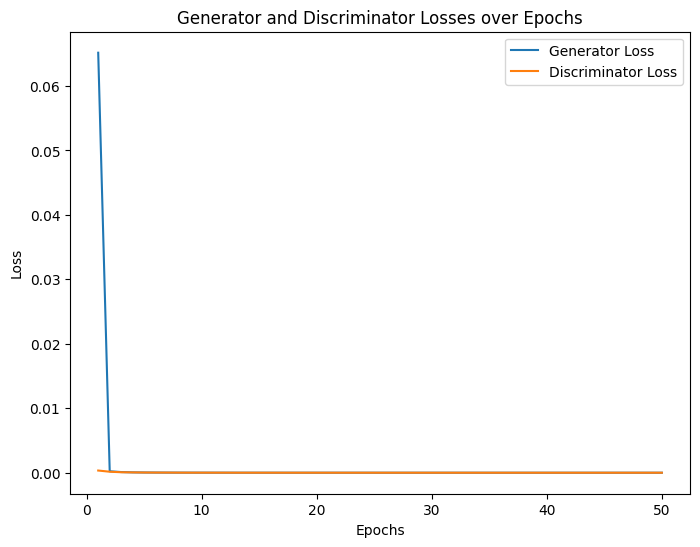

In [36]:
# Define IGMM-GAN architecture
latent_dim = 100  # Define your latent dimension size
input_dim = train_data.shape[1]

# Define Generator
generator = tf.keras.Sequential([
    Dense(100, input_dim=latent_dim),
    LeakyReLU(alpha=0.2),
    Dense(20),
    LeakyReLU(alpha=0.2),
    Dense(20),
    LeakyReLU(alpha=0.2),
    Dense(input_dim, activation='sigmoid')  # Output layer
])

# Define Discriminator
discriminator = tf.keras.Sequential([
    Dense(36, input_dim=input_dim),
    LeakyReLU(alpha=0.2),
    Dense(36),
    LeakyReLU(alpha=0.2),
    Dense(36),
    LeakyReLU(alpha=0.2),
    Dense(1, activation='sigmoid')  # Output layer for binary classification
])

# Compile IGMM-GAN
discriminator.compile(loss='binary_crossentropy', optimizer='adam')
discriminator.trainable = False

z = Input(shape=(latent_dim,))
gen_img = generator(z)
validity = discriminator(gen_img)

igmm_gan = Model(z, validity)
igmm_gan.compile(loss='binary_crossentropy', optimizer='adam')

# Initialize lists to store generator and discriminator losses
gen_losses = []
disc_losses = []

batch_size = 16
epochs = 50

# Train IGMM-GAN with loss tracking
for epoch in range(epochs):
    # Perform training step and obtain generator and discriminator losses
    history = igmm_gan.fit(np.random.normal(0, 1, (len(train_data), latent_dim)),
                           np.ones((len(train_data), 1)),
                           batch_size=batch_size,
                           epochs=1,  # Train for 1 epoch at a time
                           validation_data=(np.random.normal(0, 1, (len(val_data), latent_dim)),
                                            np.ones((len(val_data), 1))),
                           verbose=0)

    # Store losses in history object
    gen_loss = history.history['loss'][0]
    disc_loss = history.history['val_loss'][0]

    # Append losses to respective lists
    gen_losses.append(gen_loss)
    disc_losses.append(disc_loss)

# Plotting generator and discriminator losses
plt.figure(figsize=(8, 6))
plt.plot(range(1, epochs + 1), gen_losses, label='Generator Loss')
plt.plot(range(1, epochs + 1), disc_losses, label='Discriminator Loss')
plt.title('Generator and Discriminator Losses over Epochs')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()


In [37]:
# Predict on validation dataset
val_gen_imgs = generator.predict(np.random.normal(0, 1, (len(val_data), latent_dim)))

# Calculate anomaly scores (e.g., Euclidean distance, reconstruction error, etc.)
anomaly_scores = np.mean(np.abs(val_data - val_gen_imgs), axis=1)  # Example: using mean absolute error

# Define threshold (if available)
threshold = anomaly_scores.quantile(0.95)  # Example threshold value

10/10 [==============================] - 0s 2ms/step


In [38]:
anomalies = anomaly_scores > threshold
anomalies.info()

<class 'pandas.core.series.Series'>
Int64Index: 290 entries, 2071 to 2309
Series name: None
Non-Null Count  Dtype
--------------  -----
290 non-null    bool 
dtypes: bool(1)
memory usage: 2.5 KB


In [39]:
anomalies.value_counts()

False    275
True      15
dtype: int64

In [40]:
val_data.head()

,Term,InitialApprovalAmount,CurrentApprovalAmount,UndisbursedAmount,JobsReported,ForgivenessAmount,SBAOfficeCode_101,SBAOfficeCode_130,SBAOfficeCode_150,SBAOfficeCode_156,SBAOfficeCode_165,SBAOfficeCode_172,SBAOfficeCode_189,SBAOfficeCode_202,SBAOfficeCode_219,SBAOfficeCode_235,SBAOfficeCode_248,SBAOfficeCode_252,SBAOfficeCode_296,SBAOfficeCode_299,SBAOfficeCode_303,SBAOfficeCode_304,SBAOfficeCode_341,SBAOfficeCode_353,SBAOfficeCode_358,SBAOfficeCode_373,SBAOfficeCode_390,SBAOfficeCode_405,SBAOfficeCode_455,SBAOfficeCode_457,SBAOfficeCode_459,SBAOfficeCode_460,SBAOfficeCode_464,SBAOfficeCode_470,SBAOfficeCode_474,SBAOfficeCode_491,SBAOfficeCode_507,SBAOfficeCode_508,SBAOfficeCode_515,SBAOfficeCode_549,SBAOfficeCode_562,SBAOfficeCode_563,SBAOfficeCode_593,SBAOfficeCode_610,SBAOfficeCode_639,SBAOfficeCode_669,SBAOfficeCode_671,SBAOfficeCode_677,SBAOfficeCode_678,SBAOfficeCode_679,SBAOfficeCode_680,SBAOfficeCode_681,SBAOfficeCode_682,SBAOfficeCode_709,SBAOfficeCode_721,SBAOfficeCode_736,SBAOfficeCode_761,SBAOfficeCode_766,SBAOfficeCode_767,SBAOfficeCode_768,SBAOfficeCode_811,SBAOfficeCode_875,SBAOfficeCode_876,SBAOfficeCode_883,SBAOfficeCode_885,SBAOfficeCode_897,SBAOfficeCode_912,SBAOfficeCode_914,SBAOfficeCode_920,SBAOfficeCode_931,SBAOfficeCode_942,SBAOfficeCode_944,SBAOfficeCode_951,SBAOfficeCode_954,SBAOfficeCode_988,SBAOfficeCode_1013,SBAOfficeCode_1084,SBAOfficeCode_1086,SBAOfficeCode_1087,SBAOfficeCode_1094,ProcessingMethod_PPP,ProcessingMethod_PPS,BorrowerCity_ABBEVILLE,BorrowerCity_ABBOTT,BorrowerCity_ABERDEEN,BorrowerCity_ABILENE,BorrowerCity_ACWORTH,BorrowerCity_ADAMS,BorrowerCity_ADAMSVILLE,BorrowerCity_ADDISON,BorrowerCity_ADELANTO,BorrowerCity_AKRON,BorrowerCity_ALBANY,BorrowerCity_ALBERTVILLE,BorrowerCity_ALBUQUERQUE,BorrowerCity_ALDEN,BorrowerCity_ALEXANDRIA,BorrowerCity_ALICE,BorrowerCity_ALISO VIEJO,BorrowerCity_ALLEN,BorrowerCity_ALLEN PARK,BorrowerCity_ALMA,BorrowerCity_ALPENA,BorrowerCity_ALTADENA,BorrowerCity_ALTAMONT,BorrowerCity_ALTOONA,BorrowerCity_ALVIN,BorrowerCity_AMARILLO,BorrowerCity_AMHERST,BorrowerCity_AMORY,BorrowerCity_AMSTERDAM,BorrowerCity_ANAHEIM,BorrowerCity_ANCHORAGE,BorrowerCity_ANDALUSIA,BorrowerCity_ANDERSON,BorrowerCity_ANDOVER,BorrowerCity_ANGOLA,BorrowerCity_ANNAPOLIS,BorrowerCity_ANNISTON,BorrowerCity_ANTIOCH,BorrowerCity_APPLETON,BorrowerCity_ARCADIA,BorrowerCity_ARCHBOLD,BorrowerCity_ARDEN,BorrowerCity_ARDMORE,BorrowerCity_ARKADELPHIA,BorrowerCity_ARLINGTON,BorrowerCity_ARLINGTON HEIGHTS,BorrowerCity_ARNOLD,BorrowerCity_ARTESIA,BorrowerCity_ASHEBORO,BorrowerCity_ASHLAND,BorrowerCity_ASHLAND CITY,BorrowerCity_ASPEN,BorrowerCity_ASTON,BorrowerCity_ASTORIA,BorrowerCity_ATHENS,BorrowerCity_ATKINSON,BorrowerCity_ATLANTA,BorrowerCity_ATLANTIC BEACH,BorrowerCity_ATMORE,BorrowerCity_ATTLEBORO,BorrowerCity_ATTLEBORO FALLS,BorrowerCity_ATWATER,BorrowerCity_AUBURN,BorrowerCity_AUBURN HILLS,BorrowerCity_AUGUSTA,BorrowerCity_AURORA,BorrowerCity_AUSTIN,BorrowerCity_AVON,BorrowerCity_AVONDALE,BorrowerCity_AYER,BorrowerCity_AZLE,BorrowerCity_AZUSA,BorrowerCity_BAINBRIDGE,BorrowerCity_BAKERSFIELD,BorrowerCity_BALDWIN,BorrowerCity_BALL,BorrowerCity_BALTIMORE,BorrowerCity_BANGOR,BorrowerCity_BAR HARBOR,BorrowerCity_BARABOO,BorrowerCity_BARRINGTON,BorrowerCity_BATAVIA,BorrowerCity_BATESVILLE,BorrowerCity_BATON ROUGE,BorrowerCity_BATTLE GROUND,BorrowerCity_BATTLEFIELD,BorrowerCity_BAY SPRINGS,BorrowerCity_BAYAMON,BorrowerCity_BAYTOWN,BorrowerCity_BEAUMONT,BorrowerCity_BEAVER DAM,BorrowerCity_BEAVERCREEK,BorrowerCity_BEAVERTON,BorrowerCity_BEDFORD,BorrowerCity_BEDFORD HEIGTHS,BorrowerCity_BELGIUM,BorrowerCity_BELLEVILLE,BorrowerCity_BELLEVUE,BorrowerCity_BELLINGHAM,BorrowerCity_BELLMAWR,BorrowerCity_BELMONT,BorrowerCity_BENBROOK,BorrowerCity_BEND,BorrowerCity_BENSALEM,BorrowerCity_BENSENVILLE,BorrowerCity_BENTONVILLE,BorrowerCity_BERKELEY,BorrowerCity_BERLIN,BorrowerCity_BERNE,BorrowerCity_BERTHOUD,BorrowerCity_BESSEMER,BorrowerCity_BETHLEHEM,BorrowerCity_BILLINGS,BorrowerCity_BINGHAMTON,BorrowerCity_BI

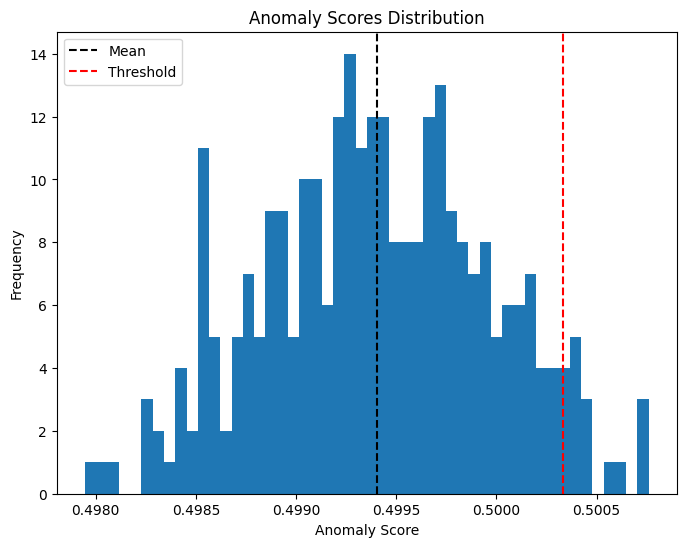

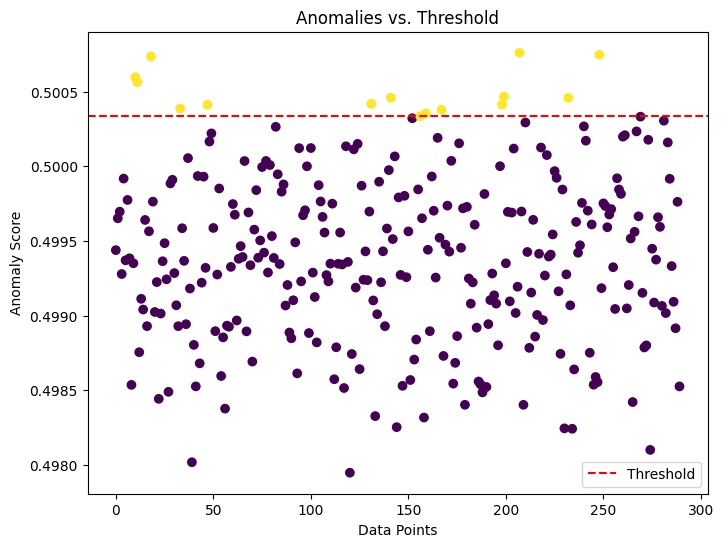

In [41]:
# Calculate mean of anomaly scores
mean_score = np.mean(anomaly_scores)

# Visualize anomaly scores distribution with mean line
plt.figure(figsize=(8, 6))
plt.hist(anomaly_scores, bins=50)
plt.axvline(x=mean_score, color='black', linestyle='--', label='Mean')
plt.axvline(x=threshold, color='r', linestyle='--', label='Threshold')
plt.title('Anomaly Scores Distribution')
plt.xlabel('Anomaly Score')
plt.ylabel('Frequency')
plt.legend()
plt.show()

# Visualize anomalies against threshold or labels
plt.figure(figsize=(8, 6))
plt.scatter(range(len(anomaly_scores)), anomaly_scores, c=anomalies, cmap='viridis')
plt.axhline(y=threshold, color='r', linestyle='--', label='Threshold')
plt.title('Anomalies vs. Threshold')
plt.xlabel('Data Points')
plt.ylabel('Anomaly Score')
plt.legend()
plt.show()

In [45]:

# Separating numerical and categorical columns in val_data
val_numerical = val_data[numerical_cols]

# Inverse scaling of numerical data
inversed_numerical_data = scaler.inverse_transform(val_numerical)
inversed_numerical_df = pd.DataFrame(inversed_numerical_data, columns=numerical_cols)

# Remove overlapping columns in categorical_cols
non_overlapping_categorical_cols = [col for col in categorical_cols if col not in val_numerical.columns]
val_categorical = val_data[encoded_categorical_cols]

# Inverse one-hot encoding of categorical data
inversed_categorical_data = encoder.inverse_transform(val_categorical)

# Get the categorical columns' names after inverse transformation
# inversed_categorical_cols = encoder.get_feature_names_out(encoded_categorical_cols)
inversed_categorical_df = pd.DataFrame(inversed_categorical_data, columns=categorical_cols)

# Combine the inverted numerical and categorical data
inversed_val_data = pd.concat([inversed_numerical_df, inversed_categorical_df], axis=1)
inversed_val_data.index = val_data.index
inversed_val_data.head()

,Term,InitialApprovalAmount,CurrentApprovalAmount,UndisbursedAmount,JobsReported,ForgivenessAmount,SBAOfficeCode,ProcessingMethod,BorrowerCity,BorrowerState,LoanStatus,ServicingLenderCity,ServicingLenderState,RuralUrbanIndicator,HubzoneIndicator,LMIIndicator,BusinessAgeDescription,ProjectCity,ProjectState,CD,NAICSCode,BusinessType,OriginatingLender,OriginatingLenderCity,OriginatingLenderState,NonProfit
2071,24.00,8073252.00,8073252.00,0.00,500.00,8194903.74,455,PPP,WEST PALM BEACH,FL,PAID IN FULL,CHARLOTTE,NC,U,N,N,NEW BUSINESS OR 2 YEARS OR LESS,WEST PALM BEACH,FL,FL-20,541330.00,CORPORATION,"BANK OF AMERICA, NATIONAL ASSOCIATION",CHARLOTTE,NC,N
1621,24.00,3558900.00,3558900.00,0.00,331.00,3592116.40,761,PPP,SHENANDOAH,IA,PAID IN FULL,SHENANDOAH,IA,R,N,N,EXISTING OR MORE THAN 2 YEARS OLD,SHENANDOAH,IA,IA-03,622110.00,NON-PROFIT ORGANIZATION,FIRST HERITAGE BANK,SHENANDOAH,IA,Y
2362,24.00,550537.00,550537.00,0.00,68.00,554298.70,920,PPP,HUNTINGTON BEACH,CA,PAID IN FULL,COLUMBUS,OH,U,Y,Y,EXISTING OR MORE THAN 2 YEARS OLD,HUNTINGTON BEACH,CA,CA-47,312120.00,LIMITED LIABILITY COMPANY(LLC),"JPMORGAN CHASE BANK, NATIONAL ASSOCIATION",COLUMBUS,OH,N
239,24.00,3275000.00,3275000.00,0.00,250.00,3315118.75,679,PPP,HOUMA,LA,PAID IN FULL,NATCHITOCHES,LA,U,Y,Y,EXISTING OR MORE THAN 2 YEARS OLD,HOUMA,LA,LA-01,336611.00,LIMITED LIABILITY COMPANY(LLC),BOM BANK,NATCHITOCHES,LA,N
1985,24.00,1915132.00,1915132.00,0.00,91.00,1942688.62,931,PPP,STOCKTON,CA,PAID IN FULL,STOCKTON,CA,U,Y,Y,EXISTING OR MORE THAN 2 YEARS OLD,STOCKTON,CA,CA-09,484230.00,CORPORATION,BAC COMMUNITY BANK,STOCKTON,CA,N


In [46]:
val_categorical.head()

,SBAOfficeCode_101,SBAOfficeCode_130,SBAOfficeCode_150,SBAOfficeCode_156,SBAOfficeCode_165,SBAOfficeCode_172,SBAOfficeCode_189,SBAOfficeCode_202,SBAOfficeCode_219,SBAOfficeCode_235,SBAOfficeCode_248,SBAOfficeCode_252,SBAOfficeCode_296,SBAOfficeCode_299,SBAOfficeCode_303,SBAOfficeCode_304,SBAOfficeCode_341,SBAOfficeCode_353,SBAOfficeCode_358,SBAOfficeCode_373,SBAOfficeCode_390,SBAOfficeCode_405,SBAOfficeCode_455,SBAOfficeCode_457,SBAOfficeCode_459,SBAOfficeCode_460,SBAOfficeCode_464,SBAOfficeCode_470,SBAOfficeCode_474,SBAOfficeCode_491,SBAOfficeCode_507,SBAOfficeCode_508,SBAOfficeCode_515,SBAOfficeCode_549,SBAOfficeCode_562,SBAOfficeCode_563,SBAOfficeCode_593,SBAOfficeCode_610,SBAOfficeCode_639,SBAOfficeCode_669,SBAOfficeCode_671,SBAOfficeCode_677,SBAOfficeCode_678,SBAOfficeCode_679,SBAOfficeCode_680,SBAOfficeCode_681,SBAOfficeCode_682,SBAOfficeCode_709,SBAOfficeCode_721,SBAOfficeCode_736,SBAOfficeCode_761,SBAOfficeCode_766,SBAOfficeCode_767,SBAOfficeCode_768,SBAOfficeCode_811,SBAOfficeCode_875,SBAOfficeCode_876,SBAOfficeCode_883,SBAOfficeCode_885,SBAOfficeCode_897,SBAOfficeCode_912,SBAOfficeCode_914,SBAOfficeCode_920,SBAOfficeCode_931,SBAOfficeCode_942,SBAOfficeCode_944,SBAOfficeCode_951,SBAOfficeCode_954,SBAOfficeCode_988,SBAOfficeCode_1013,SBAOfficeCode_1084,SBAOfficeCode_1086,SBAOfficeCode_1087,SBAOfficeCode_1094,ProcessingMethod_PPP,ProcessingMethod_PPS,BorrowerCity_ABBEVILLE,BorrowerCity_ABBOTT,BorrowerCity_ABERDEEN,BorrowerCity_ABILENE,BorrowerCity_ACWORTH,BorrowerCity_ADAMS,BorrowerCity_ADAMSVILLE,BorrowerCity_ADDISON,BorrowerCity_ADELANTO,BorrowerCity_AKRON,BorrowerCity_ALBANY,BorrowerCity_ALBERTVILLE,BorrowerCity_ALBUQUERQUE,BorrowerCity_ALDEN,BorrowerCity_ALEXANDRIA,BorrowerCity_ALICE,BorrowerCity_ALISO VIEJO,BorrowerCity_ALLEN,BorrowerCity_ALLEN PARK,BorrowerCity_ALMA,BorrowerCity_ALPENA,BorrowerCity_ALTADENA,BorrowerCity_ALTAMONT,BorrowerCity_ALTOONA,BorrowerCity_ALVIN,BorrowerCity_AMARILLO,BorrowerCity_AMHERST,BorrowerCity_AMORY,BorrowerCity_AMSTERDAM,BorrowerCity_ANAHEIM,BorrowerCity_ANCHORAGE,BorrowerCity_ANDALUSIA,BorrowerCity_ANDERSON,BorrowerCity_ANDOVER,BorrowerCity_ANGOLA,BorrowerCity_ANNAPOLIS,BorrowerCity_ANNISTON,BorrowerCity_ANTIOCH,BorrowerCity_APPLETON,BorrowerCity_ARCADIA,BorrowerCity_ARCHBOLD,BorrowerCity_ARDEN,BorrowerCity_ARDMORE,BorrowerCity_ARKADELPHIA,BorrowerCity_ARLINGTON,BorrowerCity_ARLINGTON HEIGHTS,BorrowerCity_ARNOLD,BorrowerCity_ARTESIA,BorrowerCity_ASHEBORO,BorrowerCity_ASHLAND,BorrowerCity_ASHLAND CITY,BorrowerCity_ASPEN,BorrowerCity_ASTON,BorrowerCity_ASTORIA,BorrowerCity_ATHENS,BorrowerCity_ATKINSON,BorrowerCity_ATLANTA,BorrowerCity_ATLANTIC BEACH,BorrowerCity_ATMORE,BorrowerCity_ATTLEBORO,BorrowerCity_ATTLEBORO FALLS,BorrowerCity_ATWATER,BorrowerCity_AUBURN,BorrowerCity_AUBURN HILLS,BorrowerCity_AUGUSTA,BorrowerCity_AURORA,BorrowerCity_AUSTIN,BorrowerCity_AVON,BorrowerCity_AVONDALE,BorrowerCity_AYER,BorrowerCity_AZLE,BorrowerCity_AZUSA,BorrowerCity_BAINBRIDGE,BorrowerCity_BAKERSFIELD,BorrowerCity_BALDWIN,BorrowerCity_BALL,BorrowerCity_BALTIMORE,BorrowerCity_BANGOR,BorrowerCity_BAR HARBOR,BorrowerCity_BARABOO,BorrowerCity_BARRINGTON,BorrowerCity_BATAVIA,BorrowerCity_BATESVILLE,BorrowerCity_BATON ROUGE,BorrowerCity_BATTLE GROUND,BorrowerCity_BATTLEFIELD,BorrowerCity_BAY SPRINGS,BorrowerCity_BAYAMON,BorrowerCity_BAYTOWN,BorrowerCity_BEAUMONT,BorrowerCity_BEAVER DAM,BorrowerCity_BEAVERCREEK,BorrowerCity_BEAVERTON,BorrowerCity_BEDFORD,BorrowerCity_BEDFORD HEIGTHS,BorrowerCity_BELGIUM,BorrowerCity_BELLEVILLE,BorrowerCity_BELLEVUE,BorrowerCity_BELLINGHAM,BorrowerCity_BELLMAWR,BorrowerCity_BELMONT,BorrowerCity_BENBROOK,BorrowerCity_BEND,BorrowerCity_BENSALEM,BorrowerCity_BENSENVILLE,BorrowerCity_BENTONVILLE,BorrowerCity_BERKELEY,BorrowerCity_BERLIN,BorrowerCity_BERNE,BorrowerCity_BERTHOUD,BorrowerCity_BESSEMER,BorrowerCity_BETHLEHEM,BorrowerCity_BILLINGS,BorrowerCity_BINGHAMTON,BorrowerCity_BIRMINGHAM,BorrowerCity_BISBEE,BorrowerCity_BISHOP,BorrowerCity_BLACK RIVER FALLS,BorrowerCity_BLAIN

In [47]:
val_numerical.head()

,Term,InitialApprovalAmount,CurrentApprovalAmount,UndisbursedAmount,JobsReported,ForgivenessAmount
2071,-0.30,1.60,1.63,0.00,1.41,1.75
1621,-0.30,0.03,0.04,0.00,0.48,0.14
2362,-0.30,-1.02,-1.01,0.00,-0.97,-0.93
239,-0.30,-0.07,-0.06,0.00,0.04,0.04
1985,-0.30,-0.55,-0.54,0.00,-0.84,-0.44


In [48]:
numerical_cols

['Term',
 'InitialApprovalAmount',
 'CurrentApprovalAmount',
 'UndisbursedAmount',
 'JobsReported',
 'ForgivenessAmount']

In [49]:
categorical_cols

['SBAOfficeCode',
 'ProcessingMethod',
 'BorrowerCity',
 'BorrowerState',
 'LoanStatus',
 'ServicingLenderCity',
 'ServicingLenderState',
 'RuralUrbanIndicator',
 'HubzoneIndicator',
 'LMIIndicator',
 'BusinessAgeDescription',
 'ProjectCity',
 'ProjectState',
 'CD',
 'NAICSCode',
 'BusinessType',
 'OriginatingLender',
 'OriginatingLenderCity',
 'OriginatingLenderState',
 'NonProfit']

In [50]:
val_data.head()

,Term,InitialApprovalAmount,CurrentApprovalAmount,UndisbursedAmount,JobsReported,ForgivenessAmount,SBAOfficeCode_101,SBAOfficeCode_130,SBAOfficeCode_150,SBAOfficeCode_156,SBAOfficeCode_165,SBAOfficeCode_172,SBAOfficeCode_189,SBAOfficeCode_202,SBAOfficeCode_219,SBAOfficeCode_235,SBAOfficeCode_248,SBAOfficeCode_252,SBAOfficeCode_296,SBAOfficeCode_299,SBAOfficeCode_303,SBAOfficeCode_304,SBAOfficeCode_341,SBAOfficeCode_353,SBAOfficeCode_358,SBAOfficeCode_373,SBAOfficeCode_390,SBAOfficeCode_405,SBAOfficeCode_455,SBAOfficeCode_457,SBAOfficeCode_459,SBAOfficeCode_460,SBAOfficeCode_464,SBAOfficeCode_470,SBAOfficeCode_474,SBAOfficeCode_491,SBAOfficeCode_507,SBAOfficeCode_508,SBAOfficeCode_515,SBAOfficeCode_549,SBAOfficeCode_562,SBAOfficeCode_563,SBAOfficeCode_593,SBAOfficeCode_610,SBAOfficeCode_639,SBAOfficeCode_669,SBAOfficeCode_671,SBAOfficeCode_677,SBAOfficeCode_678,SBAOfficeCode_679,SBAOfficeCode_680,SBAOfficeCode_681,SBAOfficeCode_682,SBAOfficeCode_709,SBAOfficeCode_721,SBAOfficeCode_736,SBAOfficeCode_761,SBAOfficeCode_766,SBAOfficeCode_767,SBAOfficeCode_768,SBAOfficeCode_811,SBAOfficeCode_875,SBAOfficeCode_876,SBAOfficeCode_883,SBAOfficeCode_885,SBAOfficeCode_897,SBAOfficeCode_912,SBAOfficeCode_914,SBAOfficeCode_920,SBAOfficeCode_931,SBAOfficeCode_942,SBAOfficeCode_944,SBAOfficeCode_951,SBAOfficeCode_954,SBAOfficeCode_988,SBAOfficeCode_1013,SBAOfficeCode_1084,SBAOfficeCode_1086,SBAOfficeCode_1087,SBAOfficeCode_1094,ProcessingMethod_PPP,ProcessingMethod_PPS,BorrowerCity_ABBEVILLE,BorrowerCity_ABBOTT,BorrowerCity_ABERDEEN,BorrowerCity_ABILENE,BorrowerCity_ACWORTH,BorrowerCity_ADAMS,BorrowerCity_ADAMSVILLE,BorrowerCity_ADDISON,BorrowerCity_ADELANTO,BorrowerCity_AKRON,BorrowerCity_ALBANY,BorrowerCity_ALBERTVILLE,BorrowerCity_ALBUQUERQUE,BorrowerCity_ALDEN,BorrowerCity_ALEXANDRIA,BorrowerCity_ALICE,BorrowerCity_ALISO VIEJO,BorrowerCity_ALLEN,BorrowerCity_ALLEN PARK,BorrowerCity_ALMA,BorrowerCity_ALPENA,BorrowerCity_ALTADENA,BorrowerCity_ALTAMONT,BorrowerCity_ALTOONA,BorrowerCity_ALVIN,BorrowerCity_AMARILLO,BorrowerCity_AMHERST,BorrowerCity_AMORY,BorrowerCity_AMSTERDAM,BorrowerCity_ANAHEIM,BorrowerCity_ANCHORAGE,BorrowerCity_ANDALUSIA,BorrowerCity_ANDERSON,BorrowerCity_ANDOVER,BorrowerCity_ANGOLA,BorrowerCity_ANNAPOLIS,BorrowerCity_ANNISTON,BorrowerCity_ANTIOCH,BorrowerCity_APPLETON,BorrowerCity_ARCADIA,BorrowerCity_ARCHBOLD,BorrowerCity_ARDEN,BorrowerCity_ARDMORE,BorrowerCity_ARKADELPHIA,BorrowerCity_ARLINGTON,BorrowerCity_ARLINGTON HEIGHTS,BorrowerCity_ARNOLD,BorrowerCity_ARTESIA,BorrowerCity_ASHEBORO,BorrowerCity_ASHLAND,BorrowerCity_ASHLAND CITY,BorrowerCity_ASPEN,BorrowerCity_ASTON,BorrowerCity_ASTORIA,BorrowerCity_ATHENS,BorrowerCity_ATKINSON,BorrowerCity_ATLANTA,BorrowerCity_ATLANTIC BEACH,BorrowerCity_ATMORE,BorrowerCity_ATTLEBORO,BorrowerCity_ATTLEBORO FALLS,BorrowerCity_ATWATER,BorrowerCity_AUBURN,BorrowerCity_AUBURN HILLS,BorrowerCity_AUGUSTA,BorrowerCity_AURORA,BorrowerCity_AUSTIN,BorrowerCity_AVON,BorrowerCity_AVONDALE,BorrowerCity_AYER,BorrowerCity_AZLE,BorrowerCity_AZUSA,BorrowerCity_BAINBRIDGE,BorrowerCity_BAKERSFIELD,BorrowerCity_BALDWIN,BorrowerCity_BALL,BorrowerCity_BALTIMORE,BorrowerCity_BANGOR,BorrowerCity_BAR HARBOR,BorrowerCity_BARABOO,BorrowerCity_BARRINGTON,BorrowerCity_BATAVIA,BorrowerCity_BATESVILLE,BorrowerCity_BATON ROUGE,BorrowerCity_BATTLE GROUND,BorrowerCity_BATTLEFIELD,BorrowerCity_BAY SPRINGS,BorrowerCity_BAYAMON,BorrowerCity_BAYTOWN,BorrowerCity_BEAUMONT,BorrowerCity_BEAVER DAM,BorrowerCity_BEAVERCREEK,BorrowerCity_BEAVERTON,BorrowerCity_BEDFORD,BorrowerCity_BEDFORD HEIGTHS,BorrowerCity_BELGIUM,BorrowerCity_BELLEVILLE,BorrowerCity_BELLEVUE,BorrowerCity_BELLINGHAM,BorrowerCity_BELLMAWR,BorrowerCity_BELMONT,BorrowerCity_BENBROOK,BorrowerCity_BEND,BorrowerCity_BENSALEM,BorrowerCity_BENSENVILLE,BorrowerCity_BENTONVILLE,BorrowerCity_BERKELEY,BorrowerCity_BERLIN,BorrowerCity_BERNE,BorrowerCity_BERTHOUD,BorrowerCity_BESSEMER,BorrowerCity_BETHLEHEM,BorrowerCity_BILLINGS,BorrowerCity_BINGHAMTON,BorrowerCity_BI

In [51]:
encoded_categorical_cols

array(['SBAOfficeCode_101', 'SBAOfficeCode_130', 'SBAOfficeCode_150', ...,
       'OriginatingLenderState_WY', 'NonProfit_N', 'NonProfit_Y'],
      dtype=object)

In [52]:
encoded_categorical_df.head()

,SBAOfficeCode_101,SBAOfficeCode_130,SBAOfficeCode_150,SBAOfficeCode_156,SBAOfficeCode_165,SBAOfficeCode_172,SBAOfficeCode_189,SBAOfficeCode_202,SBAOfficeCode_219,SBAOfficeCode_235,SBAOfficeCode_248,SBAOfficeCode_252,SBAOfficeCode_296,SBAOfficeCode_299,SBAOfficeCode_303,SBAOfficeCode_304,SBAOfficeCode_341,SBAOfficeCode_353,SBAOfficeCode_358,SBAOfficeCode_373,SBAOfficeCode_390,SBAOfficeCode_405,SBAOfficeCode_455,SBAOfficeCode_457,SBAOfficeCode_459,SBAOfficeCode_460,SBAOfficeCode_464,SBAOfficeCode_470,SBAOfficeCode_474,SBAOfficeCode_491,SBAOfficeCode_507,SBAOfficeCode_508,SBAOfficeCode_515,SBAOfficeCode_549,SBAOfficeCode_562,SBAOfficeCode_563,SBAOfficeCode_593,SBAOfficeCode_610,SBAOfficeCode_639,SBAOfficeCode_669,SBAOfficeCode_671,SBAOfficeCode_677,SBAOfficeCode_678,SBAOfficeCode_679,SBAOfficeCode_680,SBAOfficeCode_681,SBAOfficeCode_682,SBAOfficeCode_709,SBAOfficeCode_721,SBAOfficeCode_736,SBAOfficeCode_761,SBAOfficeCode_766,SBAOfficeCode_767,SBAOfficeCode_768,SBAOfficeCode_811,SBAOfficeCode_875,SBAOfficeCode_876,SBAOfficeCode_883,SBAOfficeCode_885,SBAOfficeCode_897,SBAOfficeCode_912,SBAOfficeCode_914,SBAOfficeCode_920,SBAOfficeCode_931,SBAOfficeCode_942,SBAOfficeCode_944,SBAOfficeCode_951,SBAOfficeCode_954,SBAOfficeCode_988,SBAOfficeCode_1013,SBAOfficeCode_1084,SBAOfficeCode_1086,SBAOfficeCode_1087,SBAOfficeCode_1094,ProcessingMethod_PPP,ProcessingMethod_PPS,BorrowerCity_ABBEVILLE,BorrowerCity_ABBOTT,BorrowerCity_ABERDEEN,BorrowerCity_ABILENE,BorrowerCity_ACWORTH,BorrowerCity_ADAMS,BorrowerCity_ADAMSVILLE,BorrowerCity_ADDISON,BorrowerCity_ADELANTO,BorrowerCity_AKRON,BorrowerCity_ALBANY,BorrowerCity_ALBERTVILLE,BorrowerCity_ALBUQUERQUE,BorrowerCity_ALDEN,BorrowerCity_ALEXANDRIA,BorrowerCity_ALICE,BorrowerCity_ALISO VIEJO,BorrowerCity_ALLEN,BorrowerCity_ALLEN PARK,BorrowerCity_ALMA,BorrowerCity_ALPENA,BorrowerCity_ALTADENA,BorrowerCity_ALTAMONT,BorrowerCity_ALTOONA,BorrowerCity_ALVIN,BorrowerCity_AMARILLO,BorrowerCity_AMHERST,BorrowerCity_AMORY,BorrowerCity_AMSTERDAM,BorrowerCity_ANAHEIM,BorrowerCity_ANCHORAGE,BorrowerCity_ANDALUSIA,BorrowerCity_ANDERSON,BorrowerCity_ANDOVER,BorrowerCity_ANGOLA,BorrowerCity_ANNAPOLIS,BorrowerCity_ANNISTON,BorrowerCity_ANTIOCH,BorrowerCity_APPLETON,BorrowerCity_ARCADIA,BorrowerCity_ARCHBOLD,BorrowerCity_ARDEN,BorrowerCity_ARDMORE,BorrowerCity_ARKADELPHIA,BorrowerCity_ARLINGTON,BorrowerCity_ARLINGTON HEIGHTS,BorrowerCity_ARNOLD,BorrowerCity_ARTESIA,BorrowerCity_ASHEBORO,BorrowerCity_ASHLAND,BorrowerCity_ASHLAND CITY,BorrowerCity_ASPEN,BorrowerCity_ASTON,BorrowerCity_ASTORIA,BorrowerCity_ATHENS,BorrowerCity_ATKINSON,BorrowerCity_ATLANTA,BorrowerCity_ATLANTIC BEACH,BorrowerCity_ATMORE,BorrowerCity_ATTLEBORO,BorrowerCity_ATTLEBORO FALLS,BorrowerCity_ATWATER,BorrowerCity_AUBURN,BorrowerCity_AUBURN HILLS,BorrowerCity_AUGUSTA,BorrowerCity_AURORA,BorrowerCity_AUSTIN,BorrowerCity_AVON,BorrowerCity_AVONDALE,BorrowerCity_AYER,BorrowerCity_AZLE,BorrowerCity_AZUSA,BorrowerCity_BAINBRIDGE,BorrowerCity_BAKERSFIELD,BorrowerCity_BALDWIN,BorrowerCity_BALL,BorrowerCity_BALTIMORE,BorrowerCity_BANGOR,BorrowerCity_BAR HARBOR,BorrowerCity_BARABOO,BorrowerCity_BARRINGTON,BorrowerCity_BATAVIA,BorrowerCity_BATESVILLE,BorrowerCity_BATON ROUGE,BorrowerCity_BATTLE GROUND,BorrowerCity_BATTLEFIELD,BorrowerCity_BAY SPRINGS,BorrowerCity_BAYAMON,BorrowerCity_BAYTOWN,BorrowerCity_BEAUMONT,BorrowerCity_BEAVER DAM,BorrowerCity_BEAVERCREEK,BorrowerCity_BEAVERTON,BorrowerCity_BEDFORD,BorrowerCity_BEDFORD HEIGTHS,BorrowerCity_BELGIUM,BorrowerCity_BELLEVILLE,BorrowerCity_BELLEVUE,BorrowerCity_BELLINGHAM,BorrowerCity_BELLMAWR,BorrowerCity_BELMONT,BorrowerCity_BENBROOK,BorrowerCity_BEND,BorrowerCity_BENSALEM,BorrowerCity_BENSENVILLE,BorrowerCity_BENTONVILLE,BorrowerCity_BERKELEY,BorrowerCity_BERLIN,BorrowerCity_BERNE,BorrowerCity_BERTHOUD,BorrowerCity_BESSEMER,BorrowerCity_BETHLEHEM,BorrowerCity_BILLINGS,BorrowerCity_BINGHAMTON,BorrowerCity_BIRMINGHAM,BorrowerCity_BISBEE,BorrowerCity_BISHOP,BorrowerCity_BLACK RIVER FALLS,BorrowerCity_BLAIN

In [53]:
inversed_categorical_data

array([[455, 'PPP', 'WEST PALM BEACH', ..., 'CHARLOTTE', 'NC', 'N'],
       [761, 'PPP', 'SHENANDOAH', ..., 'SHENANDOAH', 'IA', 'Y'],
       [920, 'PPP', 'HUNTINGTON BEACH', ..., 'COLUMBUS', 'OH', 'N'],
       ...,
       [353, 'PPP', 'VIENNA', ..., 'FAIRFAX', 'VA', 'N'],
       [671, 'PPP', 'SUGAR LAND', ..., 'DALLAS', 'TX', 'N'],
       [507, 'PPP', 'CAROL STREAM', ..., 'COLUMBUS', 'OH', 'Y']],
      dtype=object)

In [54]:
inversed_categorical_data.shape

(290, 20)

In [67]:
# Create DataFrames for anomaly scores and anomaly indicators
anomaly_scores_df = pd.DataFrame(anomaly_scores, columns=['Anomaly_Scores'])
anomalies_df = pd.DataFrame(anomalies, columns=['Anomalies'])

# Concatenate inversed_val_data, anomaly scores, and anomaly indicators
merged_val_data = pd.concat([inversed_val_data, anomaly_scores_df, anomalies_df], axis=1)
merged_val_data.head()

,Term,InitialApprovalAmount,CurrentApprovalAmount,UndisbursedAmount,JobsReported,ForgivenessAmount,SBAOfficeCode,ProcessingMethod,BorrowerCity,BorrowerState,LoanStatus,ServicingLenderCity,ServicingLenderState,RuralUrbanIndicator,HubzoneIndicator,LMIIndicator,BusinessAgeDescription,ProjectCity,ProjectState,CD,NAICSCode,BusinessType,OriginatingLender,OriginatingLenderCity,OriginatingLenderState,NonProfit,Anomaly_Scores,Anomalies
2071,24.00,8073252.00,8073252.00,0.00,500.00,8194903.74,455,PPP,WEST PALM BEACH,FL,PAID IN FULL,CHARLOTTE,NC,U,N,N,NEW BUSINESS OR 2 YEARS OR LESS,WEST PALM BEACH,FL,FL-20,541330.00,CORPORATION,"BANK OF AMERICA, NATIONAL ASSOCIATION",CHARLOTTE,NC,N,0.50,False
1621,24.00,3558900.00,3558900.00,0.00,331.00,3592116.40,761,PPP,SHENANDOAH,IA,PAID IN FULL,SHENANDOAH,IA,R,N,N,EXISTING OR MORE THAN 2 YEARS OLD,SHENANDOAH,IA,IA-03,622110.00,NON-PROFIT ORGANIZATION,FIRST HERITAGE BANK,SHENANDOAH,IA,Y,0.50,False
2362,24.00,550537.00,550537.00,0.00,68.00,554298.70,920,PPP,HUNTINGTON BEACH,CA,PAID IN FULL,COLUMBUS,OH,U,Y,Y,EXISTING OR MORE THAN 2 YEARS OLD,HUNTINGTON BEACH,CA,CA-47,312120.00,LIMITED LIABILITY COMPANY(LLC),"JPMORGAN CHASE BANK, NATIONAL ASSOCIATION",COLUMBUS,OH,N,0.50,False
239,24.00,3275000.00,3275000.00,0.00,250.00,3315118.75,679,PPP,HOUMA,LA,PAID IN FULL,NATCHITOCHES,LA,U,Y,Y,EXISTING OR MORE THAN 2 YEARS OLD,HOUMA,LA,LA-01,336611.00,LIMITED LIABILITY COMPANY(LLC),BOM BANK,NATCHITOCHES,LA,N,0.50,False
1985,24.00,1915132.00,1915132.00,0.00,91.00,1942688.62,931,PPP,STOCKTON,CA,PAID IN FULL,STOCKTON,CA,U,Y,Y,EXISTING OR MORE THAN 2 YEARS OLD,STOCKTON,CA,CA-09,484230.00,CORPORATION,BAC COMMUNITY BANK,STOCKTON,CA,N,0.50,False


In [56]:
merged_val_data['Anomalies'].value_counts()

False    275
True      15
Name: Anomalies, dtype: int64

In [57]:
if_columns = ['average_risk_score', 'state_name', 'scores', 'sklearn_anomaly_score', 'sklearn_normalized_scores', 'sklearn_anomaly', 'h2o_if_anomaly_score', 'h2o_if_mean_length', 'h2o_if_anomaly', 'average_risk_score_anomaly_indicator', 'final_anomaly_score', 'final_blended_anomaly_indicator']

In [70]:
matching_indices = merged_val_data.index

# Filter 'ppp' to get rows with matching index values
matching_rows_ppp = ppp[ppp.index.isin(matching_indices)]

# Print the rows
matching_rows_ppp.head()

,LoanNumber,DateApproved,SBAOfficeCode,ProcessingMethod,BorrowerName,BorrowerAddress,BorrowerCity,BorrowerState,BorrowerZip,LoanStatusDate,LoanStatus,Term,SBAGuarantyPercentage,InitialApprovalAmount,CurrentApprovalAmount,UndisbursedAmount,FranchiseName,ServicingLenderLocationID,ServicingLenderName,ServicingLenderAddress,ServicingLenderCity,ServicingLenderState,ServicingLenderZip,RuralUrbanIndicator,HubzoneIndicator,LMIIndicator,BusinessAgeDescription,ProjectCity,ProjectCountyName,ProjectState,ProjectZip,CD,JobsReported,NAICSCode,Race,Ethnicity,UTILITIES_PROCEED,PAYROLL_PROCEED,MORTGAGE_INTEREST_PROCEED,RENT_PROCEED,REFINANCE_EIDL_PROCEED,HEALTH_CARE_PROCEED,DEBT_INTEREST_PROCEED,BusinessType,OriginatingLenderLocationID,OriginatingLender,OriginatingLenderCity,OriginatingLenderState,Gender,Veteran,NonProfit,ForgivenessAmount,ForgivenessDate,UTILITIES_PROCEED_purpose,PAYROLL_PROCEED_purpose,MORTGAGE_INTEREST_PROCEED_purpose,RENT_PROCEED_purpose,REFINANCE_EIDL_PROCEED_purpose,HEALTH_CARE_PROCEED_purpose,DEBT_INTEREST_PROCEED_purpose,NAICS Industry Description,Size standards in number of employees,Forgiven,non_forgiven_loan_portion,ApprovalDifference,ApprovalDifference_per_employee,InitialApprovalAmount_per_employee,CurrentApprovalAmount_per_employee,UTILITIES_PROCEED_per_employee,PAYROLL_PROCEED_per_employee,MORTGAGE_INTEREST_PROCEED_per_employee,RENT_PROCEED_per_employee,REFINANCE_EIDL_PROCEED_per_employee,HEALTH_CARE_PROCEED_per_employee,DEBT_INTEREST_PROCEED_per_employee,ForgivenessAmount_per_employee,Prior PPP count,Prior PPS count,expected_UTILITIES_PROCEED,expected_PAYROLL_PROCEED,expected_MORTGAGE_INTEREST_PROCEED,expected_RENT_PROCEED,expected_REFINANCE_EIDL_PROCEED,expected_HEALTH_CARE_PROCEED,expected_DEBT_INTEREST_PROCEED,expected_ForgivenessAmount,expected_ApprovalDifference,expected_InitialApprovalAmount,expected_CurrentApprovalAmount,deviant_JR,deviant_JR_risk_score,deviant_UTILITIES_PROCEED,deviant_PAYROLL_PROCEED,deviant_MORTGAGE_INTEREST_PROCEED,deviant_RENT_PROCEED,deviant_REFINANCE_EIDL_PROCEED,deviant_HEALTH_CARE_PROCEED,deviant_DEBT_INTEREST_PROCEED,deviant_ForgivenessAmount,deviant_ApprovalDifference,deviant_InitialApprovalAmount,deviant_CurrentApprovalAmount,deviant_UTILITIES_PROCEED_risk_score,deviant_PAYROLL_PROCEED_risk_score,deviant_MORTGAGE_INTEREST_PROCEED_risk_score,deviant_RENT_PROCEED_risk_score,deviant_REFINANCE_EIDL_PROCEED_risk_score,deviant_HEALTH_CARE_PROCEED_risk_score,deviant_DEBT_INTEREST_PROCEED_risk_score,deviant_ForgivenessAmount_risk_score,deviant_ApprovalDifference_risk_score,deviant_InitialApprovalAmount_risk_score,deviant_CurrentApprovalAmount_risk_score,average_risk_score,state_name,scores,sklearn_anomaly_score,sklearn_normalized_scores,sklearn_anomaly,h2o_if_anomaly_score,h2o_if_mean_length,h2o_if_anomaly,average_risk_score_anomaly_indicator,final_anomaly_score,final_blended_anomaly_indicator
29,9643427203,2020-04-28,1084,PPP,HOMER ELECTRIC ASSOCIATION INC,3977 LAKE STREET,HOMER,AK,99603,2021-07-08,PAID IN FULL,24,100,4808473.42,4808473.42,0.00,UNKNOWN/NOTSTATED,3386,FIRST NATIONAL BANK ALASKA,101 W 36TH AVE,ANCHORAGE,AK,99503,R,Y,N,EXISTING OR MORE THAN 2 YEARS OLD,HOMER,KENAI PENINSULA,AK,99603,AK-,145.00,221122.00,UNANSWERED,UNKNOWN/NOTSTATED,0.00,4808473.42,0.00,0.00,0.00,0.00,0.00,CORPORATION,3386,FIRST NATIONAL BANK ALASKA,ANCHORAGE,AK,UNANSWERED,UNANSWERED,N,4861564.24,2021-06-14,0,1,0,0,0,0,0,Electric Power Distribution,1100.00,1,-53090.82,0.00,0.00,33161.89,33161.89,0.00,33161.89,0.00,0.00,0.00,0.00,0.00,33528.03,0,0,0.00,4371.34,0.00,0.00,0.00,0.00,0.00,4419.60,0.00,4371.34,4371.34,0.87,0.78,0.00,1099.00,0.00,0.00,0.00,0.00,0.00,1099.00,0.00,1099.00,1099.00,0.00,0.98,0.00,0.00,0.00,0.00,0.00,0.98,0.00,0.98,0.98,0.36,Alaska,-0.02,-1,0.55,1,0.14,19.39,1,0,0.35,1
30,7670387102,2020-04-14,1084,PPP,TIKIGAQ CORPORATION,701 S. KNIK GOOSE BAY ROAD SUITE M,WASILLA,AK,99654,2021-07-20,PAID IN FULL,24,100,4780025.00,4780025.00,0.00,UNKNOWN/NOTSTATED,116975,NORTHRIM BANK,3111 'C' ST,A

In [71]:
matching_rows_ppp['sklearn_anomaly'].value_counts()

0    273
1     17
Name: sklearn_anomaly, dtype: int64

In [72]:
matching_rows_ppp['h2o_if_anomaly'].value_counts()

0    250
1     40
Name: h2o_if_anomaly, dtype: int64

In [73]:
matching_rows_ppp['average_risk_score_anomaly_indicator'].value_counts()

0    283
1      7
Name: average_risk_score_anomaly_indicator, dtype: int64

In [74]:
matching_rows_ppp['final_blended_anomaly_indicator'].value_counts()

0    274
1     16
Name: final_blended_anomaly_indicator, dtype: int64

In [75]:
matching_rows_ppp[['Anomaly_Scores', 'Anomalies']] = merged_val_data[['Anomaly_Scores', 'Anomalies']]

# Print the resulting DataFrame
matching_rows_ppp.head()

,LoanNumber,DateApproved,SBAOfficeCode,ProcessingMethod,BorrowerName,BorrowerAddress,BorrowerCity,BorrowerState,BorrowerZip,LoanStatusDate,LoanStatus,Term,SBAGuarantyPercentage,InitialApprovalAmount,CurrentApprovalAmount,UndisbursedAmount,FranchiseName,ServicingLenderLocationID,ServicingLenderName,ServicingLenderAddress,ServicingLenderCity,ServicingLenderState,ServicingLenderZip,RuralUrbanIndicator,HubzoneIndicator,LMIIndicator,BusinessAgeDescription,ProjectCity,ProjectCountyName,ProjectState,ProjectZip,CD,JobsReported,NAICSCode,Race,Ethnicity,UTILITIES_PROCEED,PAYROLL_PROCEED,MORTGAGE_INTEREST_PROCEED,RENT_PROCEED,REFINANCE_EIDL_PROCEED,HEALTH_CARE_PROCEED,DEBT_INTEREST_PROCEED,BusinessType,OriginatingLenderLocationID,OriginatingLender,OriginatingLenderCity,OriginatingLenderState,Gender,Veteran,NonProfit,ForgivenessAmount,ForgivenessDate,UTILITIES_PROCEED_purpose,PAYROLL_PROCEED_purpose,MORTGAGE_INTEREST_PROCEED_purpose,RENT_PROCEED_purpose,REFINANCE_EIDL_PROCEED_purpose,HEALTH_CARE_PROCEED_purpose,DEBT_INTEREST_PROCEED_purpose,NAICS Industry Description,Size standards in number of employees,Forgiven,non_forgiven_loan_portion,ApprovalDifference,ApprovalDifference_per_employee,InitialApprovalAmount_per_employee,CurrentApprovalAmount_per_employee,UTILITIES_PROCEED_per_employee,PAYROLL_PROCEED_per_employee,MORTGAGE_INTEREST_PROCEED_per_employee,RENT_PROCEED_per_employee,REFINANCE_EIDL_PROCEED_per_employee,HEALTH_CARE_PROCEED_per_employee,DEBT_INTEREST_PROCEED_per_employee,ForgivenessAmount_per_employee,Prior PPP count,Prior PPS count,expected_UTILITIES_PROCEED,expected_PAYROLL_PROCEED,expected_MORTGAGE_INTEREST_PROCEED,expected_RENT_PROCEED,expected_REFINANCE_EIDL_PROCEED,expected_HEALTH_CARE_PROCEED,expected_DEBT_INTEREST_PROCEED,expected_ForgivenessAmount,expected_ApprovalDifference,expected_InitialApprovalAmount,expected_CurrentApprovalAmount,deviant_JR,deviant_JR_risk_score,deviant_UTILITIES_PROCEED,deviant_PAYROLL_PROCEED,deviant_MORTGAGE_INTEREST_PROCEED,deviant_RENT_PROCEED,deviant_REFINANCE_EIDL_PROCEED,deviant_HEALTH_CARE_PROCEED,deviant_DEBT_INTEREST_PROCEED,deviant_ForgivenessAmount,deviant_ApprovalDifference,deviant_InitialApprovalAmount,deviant_CurrentApprovalAmount,deviant_UTILITIES_PROCEED_risk_score,deviant_PAYROLL_PROCEED_risk_score,deviant_MORTGAGE_INTEREST_PROCEED_risk_score,deviant_RENT_PROCEED_risk_score,deviant_REFINANCE_EIDL_PROCEED_risk_score,deviant_HEALTH_CARE_PROCEED_risk_score,deviant_DEBT_INTEREST_PROCEED_risk_score,deviant_ForgivenessAmount_risk_score,deviant_ApprovalDifference_risk_score,deviant_InitialApprovalAmount_risk_score,deviant_CurrentApprovalAmount_risk_score,average_risk_score,state_name,scores,sklearn_anomaly_score,sklearn_normalized_scores,sklearn_anomaly,h2o_if_anomaly_score,h2o_if_mean_length,h2o_if_anomaly,average_risk_score_anomaly_indicator,final_anomaly_score,final_blended_anomaly_indicator,Anomaly_Scores,Anomalies
29,9643427203,2020-04-28,1084,PPP,HOMER ELECTRIC ASSOCIATION INC,3977 LAKE STREET,HOMER,AK,99603,2021-07-08,PAID IN FULL,24,100,4808473.42,4808473.42,0.00,UNKNOWN/NOTSTATED,3386,FIRST NATIONAL BANK ALASKA,101 W 36TH AVE,ANCHORAGE,AK,99503,R,Y,N,EXISTING OR MORE THAN 2 YEARS OLD,HOMER,KENAI PENINSULA,AK,99603,AK-,145.00,221122.00,UNANSWERED,UNKNOWN/NOTSTATED,0.00,4808473.42,0.00,0.00,0.00,0.00,0.00,CORPORATION,3386,FIRST NATIONAL BANK ALASKA,ANCHORAGE,AK,UNANSWERED,UNANSWERED,N,4861564.24,2021-06-14,0,1,0,0,0,0,0,Electric Power Distribution,1100.00,1,-53090.82,0.00,0.00,33161.89,33161.89,0.00,33161.89,0.00,0.00,0.00,0.00,0.00,33528.03,0,0,0.00,4371.34,0.00,0.00,0.00,0.00,0.00,4419.60,0.00,4371.34,4371.34,0.87,0.78,0.00,1099.00,0.00,0.00,0.00,0.00,0.00,1099.00,0.00,1099.00,1099.00,0.00,0.98,0.00,0.00,0.00,0.00,0.00,0.98,0.00,0.98,0.98,0.36,Alaska,-0.02,-1,0.55,1,0.14,19.39,1,0,0.35,1,0.50,False
30,7670387102,2020-04-14,1084,PPP,TIKIGAQ CORPORATION,701 S. KNIK GOOSE BAY ROAD SUITE M,WASILLA,AK,99654,2021-07-20,PAID IN FULL,24,100,4780025.00,4780025.00,0.00,UNKNOWN/NOTSTATE

In [76]:
matching_rows_ppp['Anomalies'].value_counts()

False    275
True      15
Name: Anomalies, dtype: int64

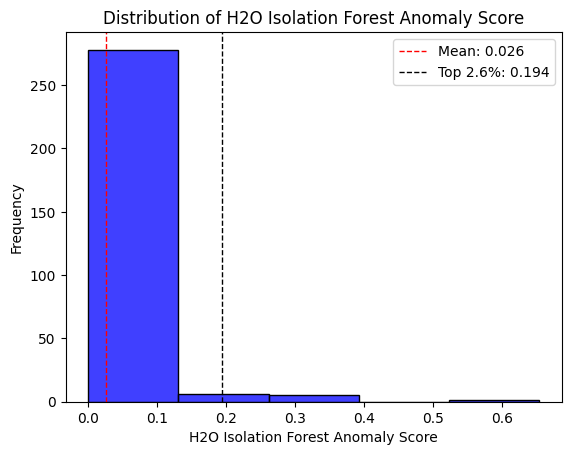

In [77]:
# Plotting the histogram using Seaborn
sns.histplot(matching_rows_ppp['h2o_if_anomaly_score'], bins=5, color='blue')

# Formatting y-axis labels with commas for thousands separator
formatter = mtick.StrMethodFormatter('{x:,.0f}')
plt.gca().yaxis.set_major_formatter(formatter)

# Setting titles and labels
plt.title('Distribution of H2O Isolation Forest Anomaly Score')
plt.xlabel('H2O Isolation Forest Anomaly Score')
plt.ylabel('Frequency')

# Show mean line and threshold line
mean_score = matching_rows_ppp['h2o_if_anomaly_score'].mean()
plt.axvline(mean_score, color='red', linestyle='dashed', linewidth=1, label=f'Mean: {mean_score:.3f}')
threshold = matching_rows_ppp['h2o_if_anomaly_score'].quantile(0.9740085423)
plt.axvline(threshold, color='black', linestyle='dashed', linewidth=1, label=f'Top 2.6%: {threshold:.3f}')
plt.legend()
plt.show()

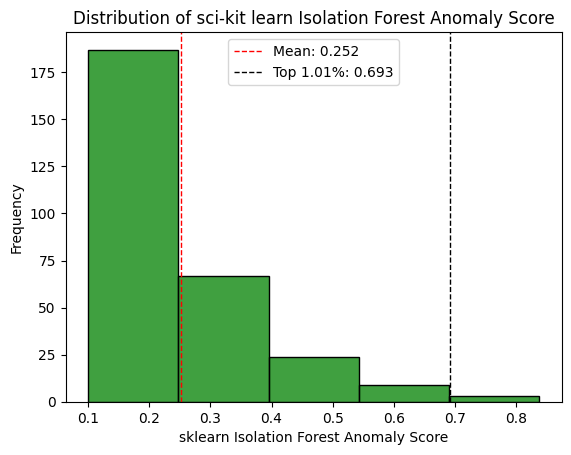

In [78]:
# Plotting the histogram using Seaborn
sns.histplot(matching_rows_ppp['sklearn_normalized_scores'], bins=5, color='green')

# Formatting y-axis labels with commas for thousands separator
formatter = mtick.StrMethodFormatter('{x:,.0f}')
plt.gca().yaxis.set_major_formatter(formatter)

# Setting titles and labels
plt.title('Distribution of sci-kit learn Isolation Forest Anomaly Score')
plt.xlabel('sklearn Isolation Forest Anomaly Score')
plt.ylabel('Frequency')

# Show mean line and threshold line
mean_score = matching_rows_ppp['sklearn_normalized_scores'].mean()
plt.axvline(mean_score, color='red', linestyle='dashed', linewidth=1, label=f'Mean: {mean_score:.3f}')
threshold = matching_rows_ppp['sklearn_normalized_scores'].quantile(0.98989844041)
plt.axvline(threshold, color='black', linestyle='dashed', linewidth=1, label=f'Top 1.01%: {threshold:.3f}')
plt.legend()
plt.show()

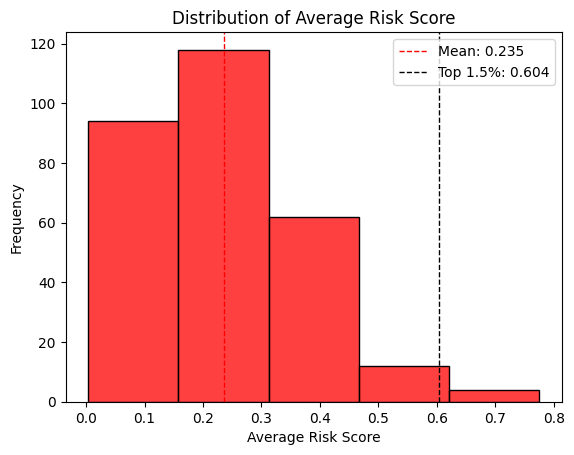

In [79]:
# Plotting the histogram using Seaborn
sns.histplot(matching_rows_ppp['average_risk_score'], bins=5, color='red')

# Formatting y-axis labels with commas for thousands separator
formatter = mtick.StrMethodFormatter('{x:,.0f}')
plt.gca().yaxis.set_major_formatter(formatter)

# Setting titles and labels
plt.title('Distribution of Average Risk Score')
plt.xlabel('Average Risk Score')
plt.ylabel('Frequency')

# Show mean line and threshold line
mean_score = matching_rows_ppp['average_risk_score'].mean()
plt.axvline(mean_score, color='red', linestyle='dashed', linewidth=1, label=f'Mean: {mean_score:.3f}')
threshold = matching_rows_ppp['average_risk_score'].quantile(0.985)
plt.axvline(threshold, color='black', linestyle='dashed', linewidth=1, label=f'Top 1.5%: {threshold:.3f}')
plt.legend()
plt.show()

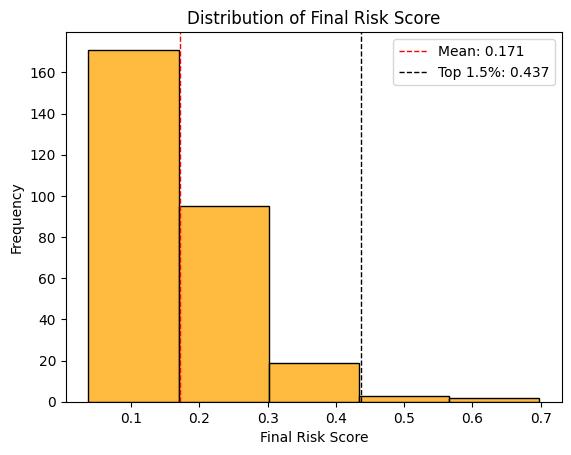

In [80]:
# Plotting the histogram using Seaborn
sns.histplot(matching_rows_ppp['final_anomaly_score'], bins=5, color='orange')

# Formatting y-axis labels with commas for thousands separator
formatter = mtick.StrMethodFormatter('{x:,.0f}')
plt.gca().yaxis.set_major_formatter(formatter)

# Setting titles and labels
plt.title('Distribution of Final Risk Score')
plt.xlabel('Final Risk Score')
plt.ylabel('Frequency')

# Show mean line and threshold line
mean_score = matching_rows_ppp['final_anomaly_score'].mean()
plt.axvline(mean_score, color='red', linestyle='dashed', linewidth=1, label=f'Mean: {mean_score:.3f}')
threshold = matching_rows_ppp['final_anomaly_score'].quantile(0.985)
plt.axvline(threshold, color='black', linestyle='dashed', linewidth=1, label=f'Top 1.5%: {threshold:.3f}')
plt.legend()
plt.show()

In [81]:
matching_rows_ppp['Anomaly_Scores'][matching_rows_ppp['Anomalies']==True].min()

0.5003343017839676

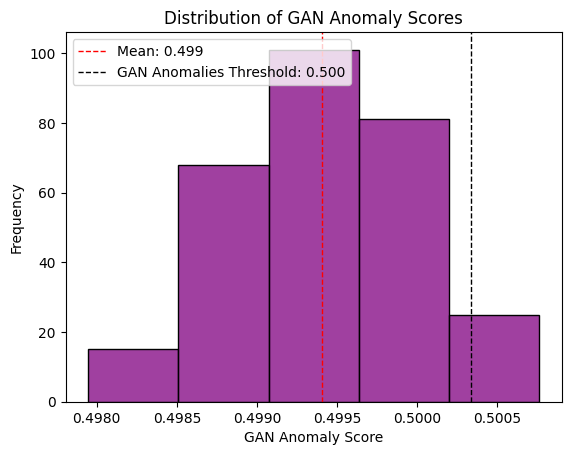

In [82]:
# Plotting the histogram using Seaborn
sns.histplot(matching_rows_ppp['Anomaly_Scores'], bins=5, color='purple')

# Formatting y-axis labels with commas for thousands separator
formatter = mtick.StrMethodFormatter('{x:,.0f}')
plt.gca().yaxis.set_major_formatter(formatter)

# Setting titles and labels
plt.title('Distribution of GAN Anomaly Scores')
plt.xlabel('GAN Anomaly Score')
plt.ylabel('Frequency')

# Show mean line and threshold line
mean_score = matching_rows_ppp['Anomaly_Scores'].mean()
plt.axvline(mean_score, color='red', linestyle='dashed', linewidth=1, label=f'Mean: {mean_score:.3f}')
threshold = matching_rows_ppp['Anomaly_Scores'][matching_rows_ppp['Anomalies']==True].min() # min anomaly score for loans marked as anomalies by GAN model
plt.axvline(threshold, color='black', linestyle='dashed', linewidth=1, label=f'GAN Anomalies Threshold: {threshold:.3f}')
plt.legend()
plt.show()

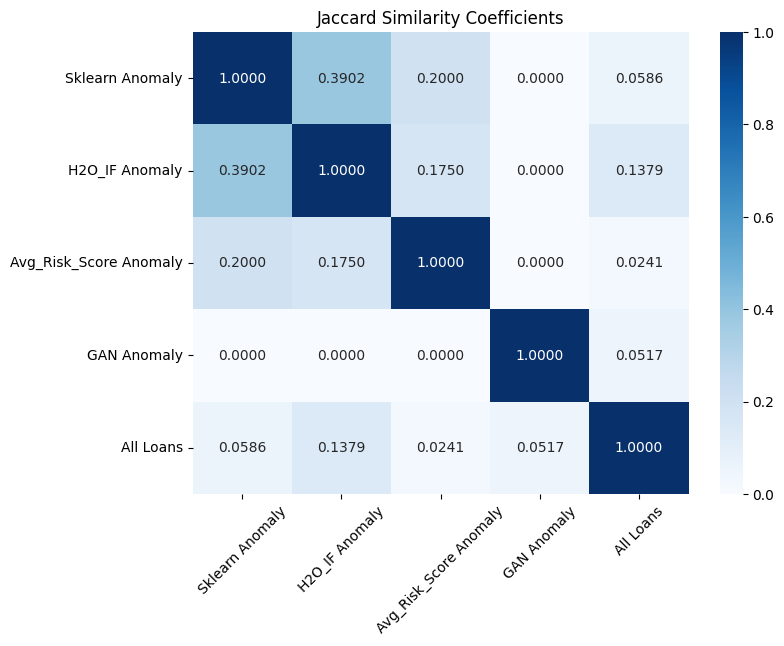

In [83]:
# Unique LoanNumbers for each subset
sklearn_anomaly_loans = set(matching_rows_ppp.loc[matching_rows_ppp['sklearn_anomaly'] == 1, 'LoanNumber'].unique())
h2o_if_anomaly_loans = set(matching_rows_ppp.loc[matching_rows_ppp['h2o_if_anomaly'] == 1, 'LoanNumber'].unique())
avg_risk_score_anomaly_loans = set(matching_rows_ppp.loc[matching_rows_ppp['average_risk_score_anomaly_indicator'] == 1, 'LoanNumber'].unique())
GAN_anomaly_loans = set(matching_rows_ppp.loc[matching_rows_ppp['Anomalies'] == True, 'LoanNumber'].unique())
all_loans = set(matching_rows_ppp['LoanNumber'].unique())

# Define the sets
sklearn_set = sklearn_anomaly_loans
h2o_if_set = h2o_if_anomaly_loans
avg_risk_score_set = avg_risk_score_anomaly_loans
GAN_set = GAN_anomaly_loans
all_set = all_loans

# Create a function to calculate Jaccard similarity
def calculate_jaccard(set1, set2):
    return round(len(set1.intersection(set2)) / len(set1.union(set2)), 4)

# Create a matrix to store Jaccard similarity coefficients
jaccard_matrix = np.zeros((5, 5))

# Calculate Jaccard similarity coefficients
sets = [sklearn_set, h2o_if_set, avg_risk_score_set, GAN_set, all_set]
for i in range(len(sets)):
    for j in range(len(sets)):
        jaccard_matrix[i][j] = calculate_jaccard(sets[i], sets[j])

# Create a DataFrame for the heatmap
columns = ['Sklearn Anomaly', 'H2O_IF Anomaly', 'Avg_Risk_Score Anomaly', 'GAN Anomaly', 'All Loans']
jaccard_df = pd.DataFrame(jaccard_matrix, columns=columns, index=columns)

# Generate the heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(jaccard_df, annot=True, cmap='Blues', fmt=".4f")
plt.xticks(rotation=45)
plt.title('Jaccard Similarity Coefficients')
plt.show()


The GAN anomalies had the second highest intersection (0.0508) with all loans, next to the H2O Isolation Forest anomalies (0.0705).

# Generate Fake Loan Data

In [84]:
num_samples_to_generate = 10000  # Adjust as needed

# Generate random noise as input for the generator
noise = np.random.normal(0, 1, (num_samples_to_generate, latent_dim))  # Assuming latent_dim is defined

# Generate fake data using the generator
generated_data = generator.predict(noise)
generated_data

313/313 [==============================] - 0s 2ms/step


array([[0.91625816, 0.9431237 , 0.3926944 , ..., 0.69793653, 0.34795028,
        0.9287792 ],
       [0.907812  , 0.9397936 , 0.42065576, ..., 0.66989326, 0.37006193,
        0.9239593 ],
       [0.89195997, 0.93338454, 0.4578984 , ..., 0.6706196 , 0.42218217,
        0.91506803],
       ...,
       [0.9091586 , 0.9360424 , 0.4105493 , ..., 0.6819316 , 0.35829085,
        0.9142306 ],
       [0.89542323, 0.92126745, 0.44046062, ..., 0.6831648 , 0.3701316 ,
        0.91637146],
       [0.9235947 , 0.9495995 , 0.42915466, ..., 0.6933127 , 0.37125152,
        0.93702924]], dtype=float32)

In [85]:
generated_data.shape

(10000, 5864)

In [86]:
# Assuming generated_data is the synthetic loan data generated by the IGMM-GAN model

# Separate numerical and categorical columns in the synthetic data
generated_numerical = generated_data[:, :len(numerical_cols)]
generated_categorical = generated_data[:, len(numerical_cols):]

# Inverse scaling of numerical data
inversed_generated_numerical = scaler.inverse_transform(generated_numerical)
inversed_generated_numerical_df = pd.DataFrame(inversed_generated_numerical, columns=numerical_cols)

# Inverse one-hot encoding of categorical data
inversed_generated_categorical = encoder.inverse_transform(generated_categorical)
inversed_generated_categorical_df = pd.DataFrame(inversed_generated_categorical, columns=categorical_cols)

# Combine the inverted numerical and categorical data for the generated samples
inversed_generated_data = pd.concat([inversed_generated_numerical_df, inversed_generated_categorical_df], axis=1)
inversed_generated_data.head()


,Term,InitialApprovalAmount,CurrentApprovalAmount,UndisbursedAmount,JobsReported,ForgivenessAmount,SBAOfficeCode,ProcessingMethod,BorrowerCity,BorrowerState,LoanStatus,ServicingLenderCity,ServicingLenderState,RuralUrbanIndicator,HubzoneIndicator,LMIIndicator,BusinessAgeDescription,ProjectCity,ProjectState,CD,NAICSCode,BusinessType,OriginatingLender,OriginatingLenderCity,OriginatingLenderState,NonProfit
0,38.64,6195556.00,4561349.50,0.92,255.41,4414712.00,678,PPP,GLEN MILLS,WY,PAID IN FULL,LA JUNTA,KS,U,Y,N,UNKNOWN/NOTSTATED,HOUSTON,MS,TX-15,611110.00,UNKNOWN/NOTSTATED,FARMERS AND MERCHANTS STATE BANK OF APPLETON,TUPELO,IL,Y
1,38.54,6185978.00,4641025.00,0.91,256.86,4513397.00,678,PPP,GLEN MILLS,WY,PAID IN FULL,LA JUNTA,KS,U,Y,N,UNKNOWN/NOTSTATED,HOUSTON,MS,WI-02,611110.00,UNKNOWN/NOTSTATED,FARMERS AND MERCHANTS STATE BANK OF APPLETON,TUPELO,IL,Y
2,38.35,6167545.50,4747147.00,0.89,258.87,4560465.00,678,PPP,GARLAND,FL,PAID IN FULL,LA JUNTA,KS,U,Y,N,UNKNOWN/NOTSTATED,HOUSTON,MS,WI-02,611110.00,UNKNOWN/NOTSTATED,VERITEX COMMUNITY BANK,DAMARISCOTTA,KS,Y
3,38.80,6221633.00,4663950.00,0.92,254.34,4475563.00,678,PPP,GARLAND,FL,PAID IN FULL,LA JUNTA,KS,U,Y,N,UNKNOWN/NOTSTATED,HOUSTON,MS,WI-02,611110.00,UNKNOWN/NOTSTATED,FARMERS BANK AND TRUST COMPANY,ABILENE,KS,Y
4,38.04,6042626.50,4722723.00,0.87,263.86,4451390.00,678,PPP,GARLAND,FL,PAID IN FULL,LA JUNTA,KS,U,Y,N,UNKNOWN/NOTSTATED,HOUSTON,MS,WI-02,611110.00,UNKNOWN/NOTSTATED,FARMERS AND MERCHANTS STATE BANK OF APPLETON,BIDDEFORD,KS,Y


For index 0:
  * There is only one city in the US called Brookshire and it is in Texas.
  * The BorrowerCity is Brookshire but the BorrowerState is Ohio, not Texas.
  * There is no city called Brady in West Virginia, but there is a Morristown in Texas.
  * The Service Lender State (WV) and, Borrower State (OH), and Project State (CT) are all different.

For index 1:
  * Bingham Farms is a village in Michigan, it does not exist in West Virginia.

In [88]:
# Count percentage loans from the ppp sample have the same state for state columns
round(len(sample_skl_anomalies[
    (sample_skl_anomalies['BorrowerState'] == sample_skl_anomalies['ServicingLenderState']) &
    (sample_skl_anomalies['ServicingLenderState'] == sample_skl_anomalies['ProjectState'])])/len(sample_skl_anomalies)*100,1)

47.0

In [89]:
# Count percentage of loans from generated data that have same state for state columns
round(len(inversed_generated_data[
    (inversed_generated_data['BorrowerState'] == inversed_generated_data['ServicingLenderState']) &
    (inversed_generated_data['ServicingLenderState'] == inversed_generated_data['ProjectState'])])/len(inversed_generated_data)*100,1)

0.0

No loans in the generated data set have the same state for state columns, while nearly 50% of real loans do.

In [90]:
# Calculate anomaly scores (e.g., Euclidean distance, reconstruction error, etc.)
anomaly_scores = np.mean(np.abs(val_data - val_gen_imgs), axis=1)  # Example: using mean absolute error

# Define threshold (if available)
threshold = anomaly_scores.quantile(0.95)  # Example threshold value